In [1]:

import numpy as np
import scanpy as sc
import scipy
from scipy.sparse import csr_matrix
import scanpy.external as sce
import pandas as pd
import matplotlib.pyplot as plt
#from composition_stats import clr
import anndata as ad
import scirpy as ir


In [2]:
!pip install git+https://github.com/gtca/muon.git


  Cloning https://github.com/gtca/muon.git to c:\users\okatk\appdata\local\temp\pip-req-build-5ak464w7
  Resolved https://github.com/gtca/muon.git to commit 6192f7698d8f3eca39412cd63699ef0b6a927d64
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'


  Running command git clone --filter=blob:none --quiet https://github.com/gtca/muon.git 'C:\Users\okatk\AppData\Local\Temp\pip-req-build-5ak464w7'


In [3]:
import muon as mu

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\okatk\AppData\Local\Programs\Python\Python3

In [4]:
help(ir)

Help on package scirpy:

NAME
    scirpy - Python library for single-cell adaptive immune receptor repertoire (AIRR) analysis

PACKAGE CONTENTS
    _compat
    _metadata
    datasets (package)
    get (package)
    io (package)
    ir_dist (package)
    pl (package)
    pp (package)
    tests (package)
    tl (package)
    util (package)

VERSION
    0.13.0rc1

FILE
    c:\users\okatk\appdata\local\programs\python\python311\lib\site-packages\scirpy\__init__.py




In [5]:
!dir

 Volume in drive C is Windows
 Volume Serial Number is CAD3-AF8B

 Directory of C:\Users\okatk\Drexel

08/15/2023  12:08 PM    <DIR>          .
08/14/2023  05:41 PM    <DIR>          ..
08/14/2023  12:11 PM    <DIR>          .ipynb_checkpoints
08/14/2023  05:51 PM         3,483,376 aligned_protein.h5ad
08/09/2023  12:09 PM    <DIR>          myenv
08/14/2023  12:46 PM        96,130,670 new_protein.h5ad
08/14/2023  12:48 PM        11,169,364 new_qc_protein.h5ad
08/14/2023  10:20 AM           474,394 Protein Data Analysis.ipynb
08/05/2023  09:39 PM         1,995,594 TCR_tasks (6).ipynb
08/15/2023  12:08 PM            57,393 TCR_tasks(08052023).ipynb
08/14/2023  12:50 PM            30,108 TCR_tasks_4.ipynb
               7 File(s)    113,340,899 bytes
               4 Dir(s)  891,633,270,784 bytes free


In [6]:
# load in everything, perform batch correction with harmony and the normal qc from scirpy

file_list = [
     ir.io.read_10x_vdj(r"C:\Users\okatk\OneDrive - Tredyffrin Easttown School District\Drexel Research\filtered_contig_annotations_lib_1.csv"), 
     ir.io.read_10x_vdj(r"C:\Users\okatk\OneDrive - Tredyffrin Easttown School District\Drexel Research\filtered_contig_annotations_lib_2.csv"), 
     ir.io.read_10x_vdj(r"C:\Users\okatk\OneDrive - Tredyffrin Easttown School District\Drexel Research\filtered_contig_annotations_lib_3.csv")
]
# 14206, 15031, 14752

#labels = 14206*["lib1"] +  15031* ["lib2"]+ 14752*["lib3"]
new_l = []
for index in range(len(file_list)):
    adata = file_list[index]
    adata.obs["batch"] = "lib_" + str(index)
    new_l.append(adata)
    


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\aligned_mapping.py:54: ExperimentalFeatureWarning: Support for Awkward Arrays is currently experimental. Behavior may change in the future. Please report any issues you may encounter!
  warnings.warn(


In [7]:
tcr_concat = ad.concat(new_l, merge="same")
# add batch labels
tcr_concat.obs_names_make_unique()
# now TCR qc
ir.pp.index_chains(tcr_concat) # only needs airr
ir.tl.chain_qc(tcr_concat) # only needs airr

print(tcr_concat.obs.receptor_subtype)
#raise Error
# further tcr qc
mu.pp.filter_obs(tcr_concat, "chain_pairing", lambda x: x != "multichain")
mu.pp.filter_obs(tcr_concat, "chain_pairing", lambda x: ~np.isin(x, ["orphan VDJ", "orphan VJ"]))
# it would appear that batch correction is ill-posed here.
# basic dim reduction for each modality
# sc.pp.pca(tcr_concat)
# # batch correction
# sce.pp.harmony_integrate(tcr_concat, 'batch') 
# then save it in same manner as other modalities
tcr_concat.write_h5ad(r"C:\Users\okatk\OneDrive - Tredyffrin Easttown School District\Drexel Research\correct_tcr.h5ad")

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


  0%|          | 0/43989 [00:00<?, ?it/s]

cell_id
AAACCTGAGACTAAGT-1      TRA+TRB
AAACCTGAGAGGGATA-1      TRA+TRB
AAACCTGAGCAATCTC-1      TRA+TRB
AAACCTGAGCCCAGCT-1      TRA+TRB
AAACCTGAGCTCCTCT-1      TRA+TRB
                         ...   
TTTGTCAGTGAAAGAG-1      TRA+TRB
TTTGTCAGTGAAGGCT-1      TRA+TRB
TTTGTCATCACGATGT-1      TRA+TRB
TTTGTCATCCACTGGG-1      TRA+TRB
TTTGTCATCTTGGGTA-1-1    TRA+TRB
Name: receptor_subtype, Length: 43989, dtype: object


In [8]:
print(tcr_concat.obs.receptor_subtype.unique())

['TRA+TRB']
Categories (1, object): ['TRA+TRB']


In [9]:
help(ir)


Help on package scirpy:

NAME
    scirpy - Python library for single-cell adaptive immune receptor repertoire (AIRR) analysis

PACKAGE CONTENTS
    _compat
    _metadata
    datasets (package)
    get (package)
    io (package)
    ir_dist (package)
    pl (package)
    pp (package)
    tests (package)
    tl (package)
    util (package)

VERSION
    0.13.0rc1

FILE
    c:\users\okatk\appdata\local\programs\python\python311\lib\site-packages\scirpy\__init__.py




In [10]:
# load in files 
file_list = [
    sc.read_h5ad(r"C:\Users\okatk\OneDrive - Tredyffrin Easttown School District\Drexel Research\correct_rna.h5ad"),
    sc.read_h5ad(r"C:\Users\okatk\OneDrive - Tredyffrin Easttown School District\Drexel Research\correct_tcr.h5ad"),
    sc.read_h5ad("new_qc_protein.h5ad")

    
]
for adata in file_list:
    try:
        adata.uns['log1p']["base"] = None 
    except:
        pass
# fill out the mudata object
mdata = mu.MuData({"gex": file_list[0],  
                   "airr": file_list[1],
                   "prot": file_list[2]})

mdata["gex"], mdata["airr"], mdata["prot"]

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:479: UserWarning: obs_names are not unique. To make them unique, call `.obs_names_make_unique`.
  warnings.warn(


(AnnData object with n_obs × n_vars = 47024 × 28608
     obs: 'TotalSeq-C0251 anti-human Hashtag 1 Antibody', 'TotalSeq-C0252 anti-human Hashtag 2 Antibody', 'TotalSeq-C0253 anti-human Hashtag 3 Antibody', 'TotalSeq-C0254 anti-human Hashtag 4 Antibody', 'TotalSeq-C0255 anti-human Hashtag 5 Antibody', 'TotalSeq-C0256 anti-human Hashtag 6 Antibody', 'TotalSeq-C0257 anti-human Hashtag 7 Antibody', 'TotalSeq-C0258 anti-human Hashtag 8 Antibody', 'TotalSeq-C0259 anti-human Hashtag 9 Antibody', 'TotalSeq-C0260 anti-human Hashtag 10 Antibody', 'TotalSeq-C0262 anti-human Hashtag 12 Antibody', 'TotalSeq-C0263 anti-human Hashtag 13 Antibody', 'most_likely_hypothesis', 'cluster_feature', 'negative_hypothesis_probability', 'singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification', 'Thaw', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
     var: 'gene_ids', 'featu

In [11]:
# Get the number of cells in the 'prot' data
num_cells_prot = mdata["prot"].shape[0]

print(f"Number of cells in the 'prot' data (before common_cells step): {num_cells_prot}")


Number of cells in the 'prot' data (before common_cells step): 9502


In [12]:
mdata["airr"].obs.receptor_subtype

cell_id
AAACCTGAGACTAAGT-1      TRA+TRB
AAACCTGAGCAATCTC-1      TRA+TRB
AAACCTGAGCCCAGCT-1      TRA+TRB
AAACCTGAGCTCCTCT-1      TRA+TRB
AAACCTGAGGACGAAA-1      TRA+TRB
                         ...   
TTTGTCAGTGAAAGAG-1      TRA+TRB
TTTGTCAGTGAAGGCT-1      TRA+TRB
TTTGTCATCACGATGT-1      TRA+TRB
TTTGTCATCCACTGGG-1      TRA+TRB
TTTGTCATCTTGGGTA-1-1    TRA+TRB
Name: receptor_subtype, Length: 40077, dtype: category
Categories (1, object): ['TRA+TRB']

In [13]:
airr_cell_ids = set(mdata["airr"].obs.index)
gex_cell_ids = set(mdata["gex"].obs.index)
prot_cell_ids = set(mdata["prot"].obs.index)

In [14]:
len(airr_cell_ids)

40077

In [15]:
len(gex_cell_ids)

47024

In [16]:
len(prot_cell_ids)

9469

In [17]:
len(airr_cell_ids), len(gex_cell_ids), len(prot_cell_ids)

(40077, 47024, 9469)

In [18]:
# check if there are cell barcodes that exist in airr and not in gex
#len(airr_cell_ids - gex_cell_ids), len(prot_cell_ids - gex_cell_ids), len(prot_cell_ids - airr_cell_ids), len(airr_cell_ids - prot_cell_ids)
# check if there are cell barcodes that exist in prot and not in gex
len(gex_cell_ids - airr_cell_ids)
# check if there are cell barcodes that exist in prot and not in airr

21596

  0%|          | 0/13524 [00:00<?, ?it/s]

Index(['gex:TotalSeq-C0251 anti-human Hashtag 1 Antibody',
       'gex:TotalSeq-C0252 anti-human Hashtag 2 Antibody',
       'gex:TotalSeq-C0253 anti-human Hashtag 3 Antibody',
       'gex:TotalSeq-C0254 anti-human Hashtag 4 Antibody',
       'gex:TotalSeq-C0255 anti-human Hashtag 5 Antibody',
       'gex:TotalSeq-C0256 anti-human Hashtag 6 Antibody',
       'gex:TotalSeq-C0257 anti-human Hashtag 7 Antibody',
       'gex:TotalSeq-C0258 anti-human Hashtag 8 Antibody',
       'gex:TotalSeq-C0259 anti-human Hashtag 9 Antibody',
       'gex:TotalSeq-C0260 anti-human Hashtag 10 Antibody',
       'gex:TotalSeq-C0262 anti-human Hashtag 12 Antibody',
       'gex:TotalSeq-C0263 anti-human Hashtag 13 Antibody',
       'gex:most_likely_hypothesis', 'gex:cluster_feature',
       'gex:negative_hypothesis_probability',
       'gex:singlet_hypothesis_probability',
       'gex:doublet_hypothesis_probability', 'gex:Classification', 'gex:Thaw',
       'gex:batch', 'gex:n_genes_by_counts', 'gex:total_cou

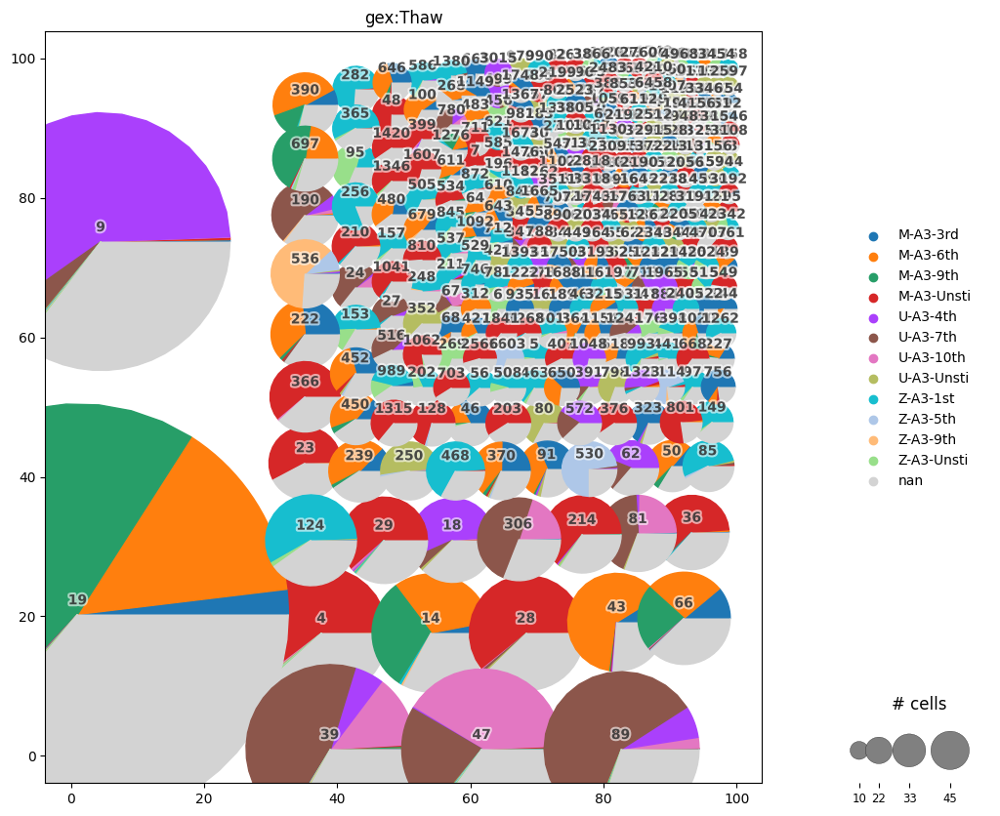

In [19]:
#080623 Task 1

# define clonotypes
# using default parameters, `ir_dist` will compute nucleotide sequence identity

ir.pp.ir_dist(mdata)
ir.tl.define_clonotypes(mdata, receptor_arms="all", dual_ir="primary_only")
ir.tl.clonotype_network(mdata, min_cells=10) #50, 100 is good
# we don't have source, just use sample labels here
ir.pl.clonotype_network( # color='Thaw'
    mdata,color='gex:Thaw') #, base_size=20, label_fontsize=9, panel_size=(7, 7)

print(mdata.obs.columns)

In [20]:
# Map the "Thaw" information from mdata["gex"].obs to mdata["airr"].obs
mdata["airr"].obs["Thaw"] = mdata["airr"].obs.index.map(mdata["gex"].obs["Thaw"])

# Check if the mapping was successful by displaying the first few rows of mdata["airr"].obs
mdata["airr"].obs.head()


,high_confidence,is_cell,batch,receptor_type,receptor_subtype,chain_pairing,clone_id,clone_id_size,Thaw
cell_id,,,,,,,,,
AAACCTGAGACTAAGT-1,True,True,lib_0,TCR,TRA+TRB,extra VJ,0,1,M-A3-3rd
AAACCTGAGCAATCTC-1,True,True,lib_0,TCR,TRA+TRB,extra VJ,1,5,M-A3-Unsti
AAACCTGAGCCCAGCT-1,True,True,lib_0,TCR,TRA+TRB,single pair,2,1,U-A3-Unsti
AAACCTGAGCTCCTCT-1,True,True,lib_0,TCR,TRA+TRB,extra VDJ,3,1,NaN
AAACCTGAGGACGAAA-1,True,True,lib_0,TCR,TRA+TRB,single pair,4,530,M-A3-Unsti


In [21]:
mdata.mod['airr'].obs.columns


Index(['high_confidence', 'is_cell', 'batch', 'receptor_type',
       'receptor_subtype', 'chain_pairing', 'clone_id', 'clone_id_size',
       'Thaw'],
      dtype='object')

  0%|          | 0/13524 [00:00<?, ?it/s]

Index(['gex:TotalSeq-C0251 anti-human Hashtag 1 Antibody',
       'gex:TotalSeq-C0252 anti-human Hashtag 2 Antibody',
       'gex:TotalSeq-C0253 anti-human Hashtag 3 Antibody',
       'gex:TotalSeq-C0254 anti-human Hashtag 4 Antibody',
       'gex:TotalSeq-C0255 anti-human Hashtag 5 Antibody',
       'gex:TotalSeq-C0256 anti-human Hashtag 6 Antibody',
       'gex:TotalSeq-C0257 anti-human Hashtag 7 Antibody',
       'gex:TotalSeq-C0258 anti-human Hashtag 8 Antibody',
       'gex:TotalSeq-C0259 anti-human Hashtag 9 Antibody',
       'gex:TotalSeq-C0260 anti-human Hashtag 10 Antibody',
       'gex:TotalSeq-C0262 anti-human Hashtag 12 Antibody',
       'gex:TotalSeq-C0263 anti-human Hashtag 13 Antibody',
       'gex:most_likely_hypothesis', 'gex:cluster_feature',
       'gex:negative_hypothesis_probability',
       'gex:singlet_hypothesis_probability',
       'gex:doublet_hypothesis_probability', 'gex:Classification', 'gex:Thaw',
       'gex:batch', 'gex:n_genes_by_counts', 'gex:total_cou

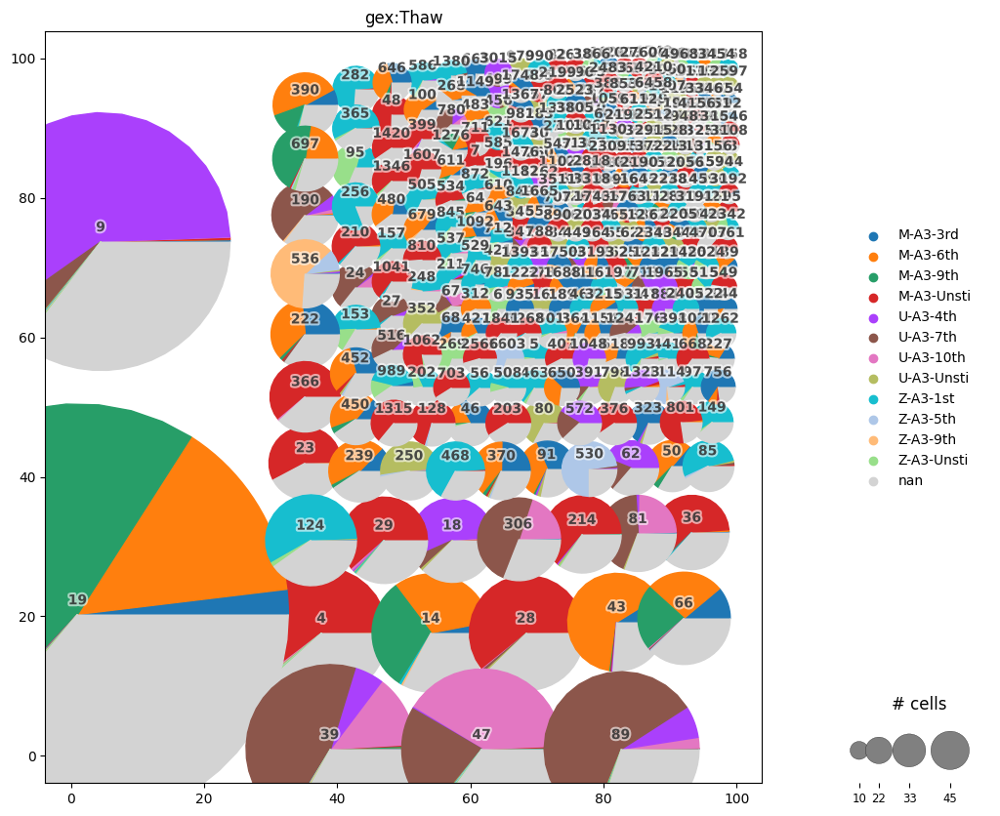

In [22]:
# Assuming mdata is your loaded and preprocessed AnnData object

# 1. Compute the immune repertoire distance
ir.pp.ir_dist(mdata)

# 2. Define clonotypes
ir.tl.define_clonotypes(mdata, receptor_arms="all", dual_ir="primary_only")

# 3. Compute the clonotype network
ir.tl.clonotype_network(mdata, min_cells=10) # Adjusting the min_cells parameter as needed

# 4. Visualize the clonotype network
ir.pl.clonotype_network(mdata, color='gex:Thaw') # Adjust visual parameters as needed

# 5. Print the observation column names
print(mdata.obs.columns)


In [23]:
list(mdata.mod.keys())


['gex', 'airr', 'prot']

In [29]:
#080623 Task 1 for individual donor graphs

mdata["gex"].obs_names_make_unique()
mdata["airr"].obs_names_make_unique()
mdata["prot"].obs_names_make_unique()


# Calculate the predominant donor for each clonotype
mdata.obs['donor'] = mdata["gex"].obs['Thaw'].apply(lambda x: x[0])

def get_predominant_donor(x):
    try:
        return x.value_counts().index[0]
    except IndexError:
        return None

predominant_donor = mdata.obs.groupby('airr:clone_id')['donor'].agg(get_predominant_donor)

# Map the predominant donor to each cell
mdata.obs['predominant_donor'] = mdata.obs['airr:clone_id'].map(predominant_donor)

# Get the unique donors
donors = mdata.obs['predominant_donor'].unique()

# Generate separate plots for each donor
for donor in donors:
    if donor is not None:  # Skip None
        subset = mdata[mdata.obs['predominant_donor'] == donor]
        if subset.obs.shape[0] > 0:  # Check that the subset has cells
            ir.pl.clonotype_network(
                subset, 
                color='gex:Thaw'  # Use the correct color attribute if you want to color the network differently
            )
            

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-pac

ValueError: Length of values (8076) does not match length of index (8084)

In [27]:
#080623 Task 1 for individual donor graphs

# Calculate the predominant donor for each clonotype
mdata.obs['donor'] = mdata["gex"].obs['Thaw'].apply(lambda x: x[0])

def get_predominant_donor(x):
    try:
        return x.value_counts().index[0]
    except IndexError:
        return None

predominant_donor = mdata.obs.groupby('airr:clone_id')['donor'].agg(get_predominant_donor)

# Map the predominant donor to each cell
mdata.obs['predominant_donor'] = mdata.obs['airr:clone_id'].map(predominant_donor)

# Get the unique donors
donors = mdata.obs['predominant_donor'].unique()

# Generate separate plots for each donor
for donor in donors:
    if donor is not None:  # Skip None
        subset = mdata[mdata.obs['predominant_donor'] == donor]
        if subset.obs.shape[0] > 0:  # Check that the subset has cells
            ir.pl.clonotype_network(
                subset, 
                color='gex:Thaw'  # Use the correct color attribute if you want to color the network differently
            )
            

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-pac

InvalidIndexError: Reindexing only valid with uniquely valued Index objects

Observation names are unique.
Length of mdata.obs: 64605
Unique airr:clone_id: 13524
Length of predominant_donor: 13524
Observation names remain unique after mapping.


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python3

For donor Z, unique obs names: False


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python3

For donor M, unique obs names: False
For donor nan, unique obs names: True


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python3

For donor U, unique obs names: False


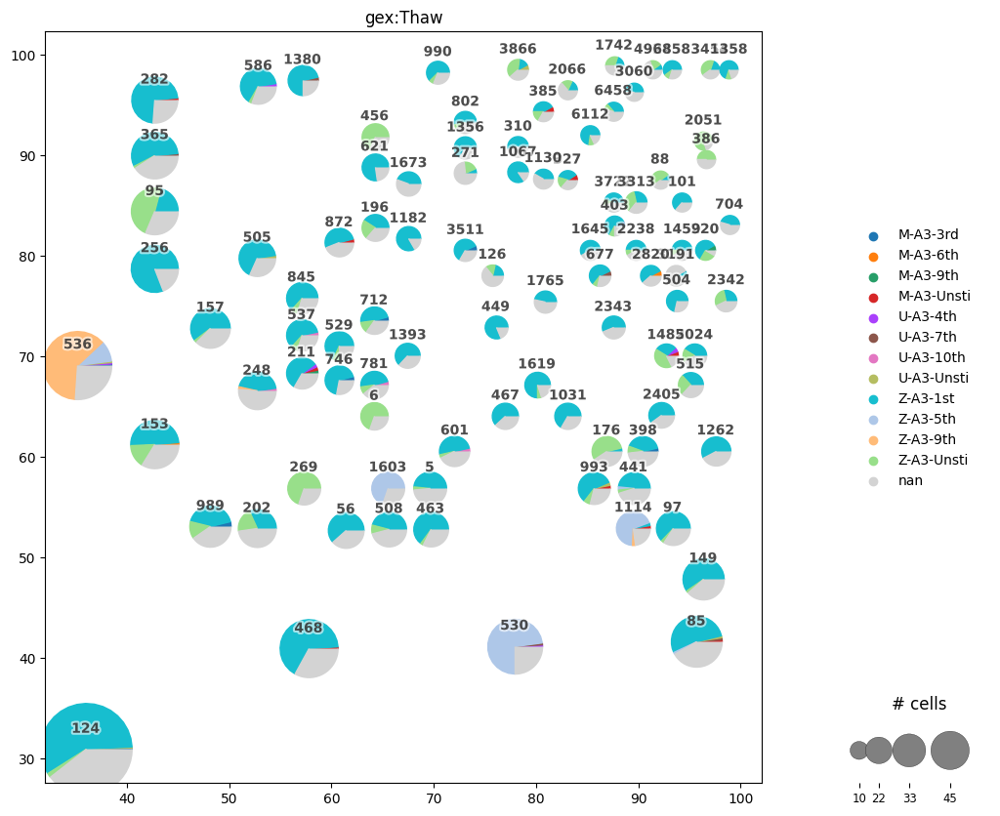

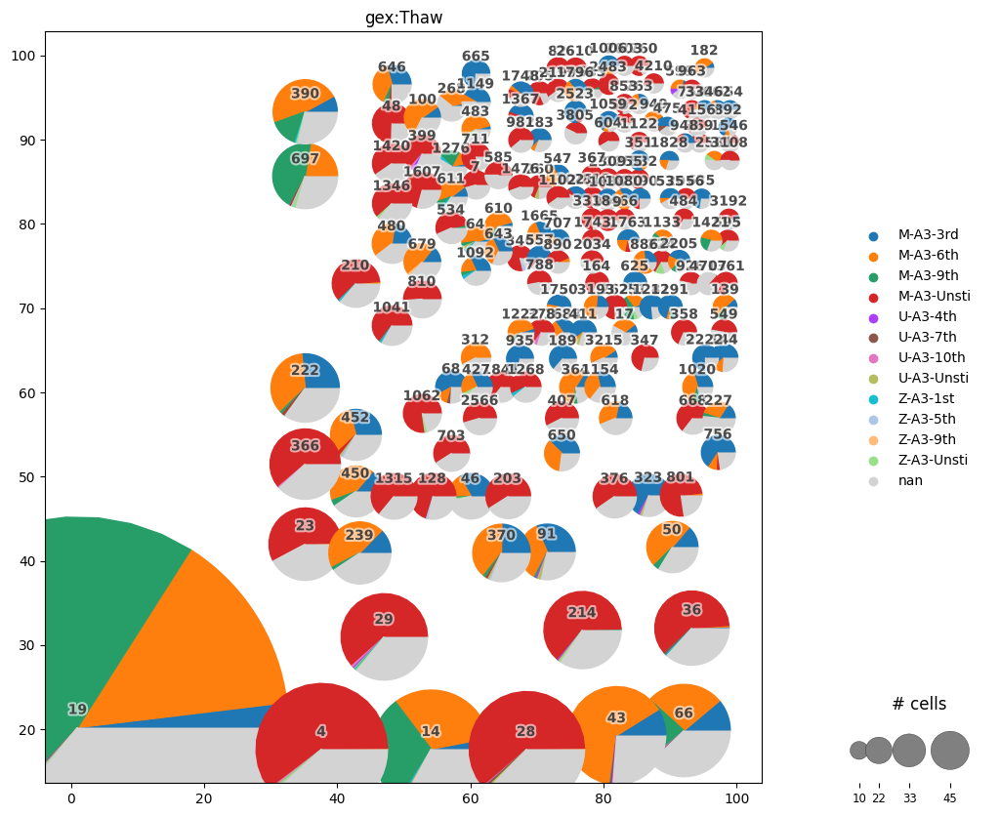

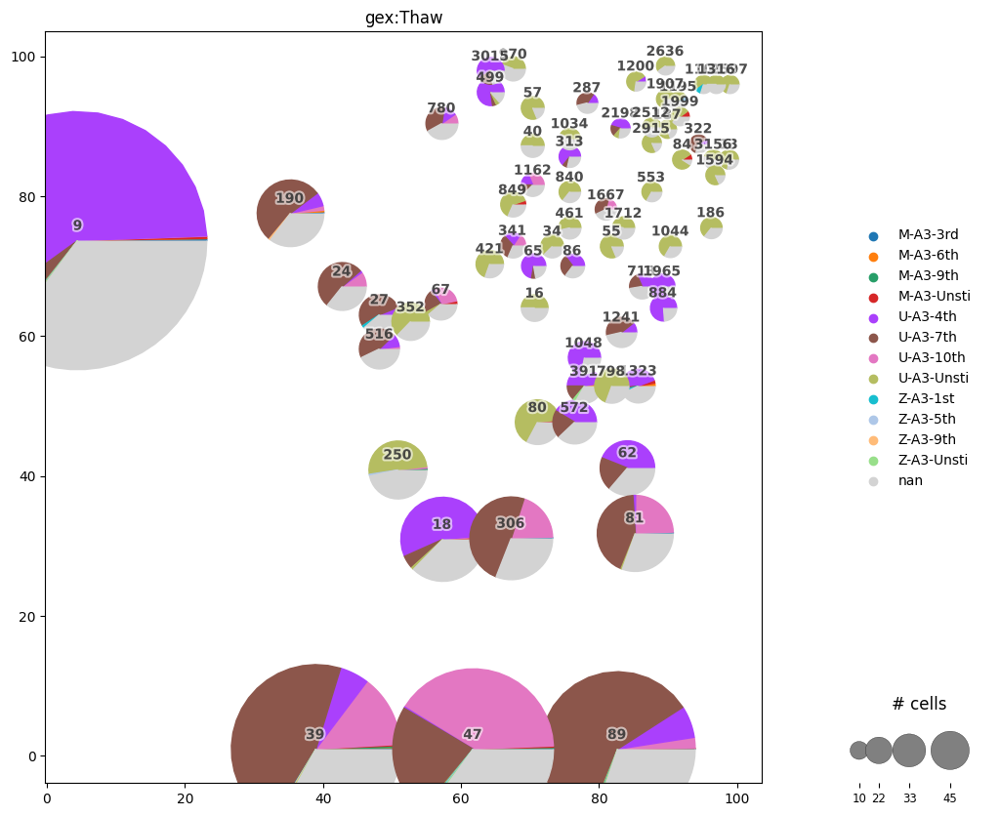

In [30]:
# Manually enforce unique observation names
def make_obs_names_unique(obs_index):
    obs = pd.Series(obs_index)
    counts = obs.groupby(obs).count()
    duplicates = counts[counts > 1].index
    for dup in duplicates:
        idxs = obs[obs == dup].index
        for i, idx in enumerate(idxs, 1):
            obs.at[idx] = f"{dup}-{i}"
    return obs

mdata.obs.index = make_obs_names_unique(mdata.obs.index)

# Check for uniqueness of observation names
if mdata.obs.index.is_unique:
    print("Observation names are unique.")
else:
    print("Warning: Observation names are not unique.")

# Calculate the predominant donor for each clonotype
mdata.obs['donor'] = mdata["gex"].obs['Thaw'].apply(lambda x: x[0])

def get_predominant_donor(x):
    try:
        return x.value_counts().index[0]
    except IndexError:
        return None

predominant_donor = mdata.obs.groupby('airr:clone_id')['donor'].agg(get_predominant_donor)

# Diagnostic print statements
print("Length of mdata.obs:", len(mdata.obs))
print("Unique airr:clone_id:", mdata.obs['airr:clone_id'].nunique())
print("Length of predominant_donor:", len(predominant_donor))

# Map the predominant donor to each cell
mdata.obs['predominant_donor'] = mdata.obs['airr:clone_id'].map(predominant_donor)

# Check if observation names are still unique after mapping
if mdata.obs.index.is_unique:
    print("Observation names remain unique after mapping.")
else:
    print("Warning: Observation names are no longer unique after mapping.")

# Get the unique donors
donors = mdata.obs['predominant_donor'].unique()

# Generate separate plots for each donor
for donor in donors:
    if donor is not None:  # Skip None
        subset = mdata[mdata.obs['predominant_donor'] == donor].copy()
        
        # Diagnose the subset operation
        print(f"For donor {donor}, unique obs names: {subset.obs.index.is_unique}")
        
        if subset.obs.shape[0] > 0:  # Check that the subset has cells
            ir.pl.clonotype_network(
                subset, 
                color='gex:Thaw'  # Use the correct color attribute if you want to color the network differently
            )


In [33]:
mdata["airr"].obs.columns


Index(['high_confidence', 'is_cell', 'batch', 'receptor_type',
       'receptor_subtype', 'chain_pairing', 'clone_id', 'clone_id_size',
       'Thaw', 'derived_donor'],
      dtype='object')

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModification

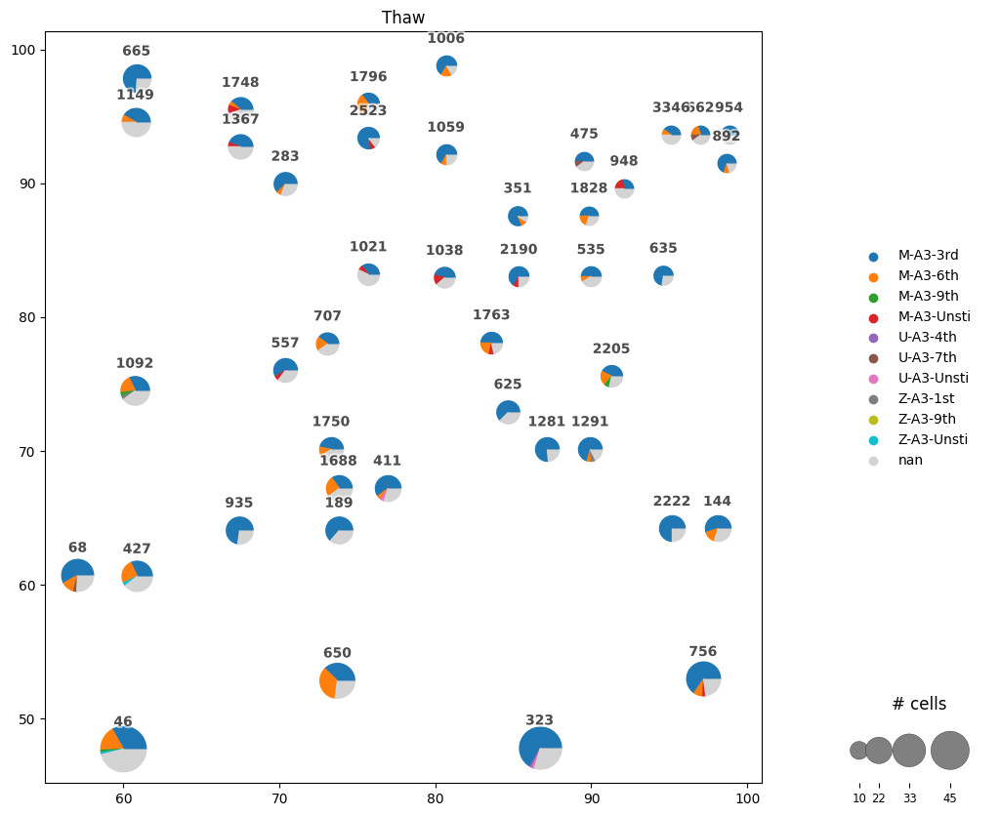

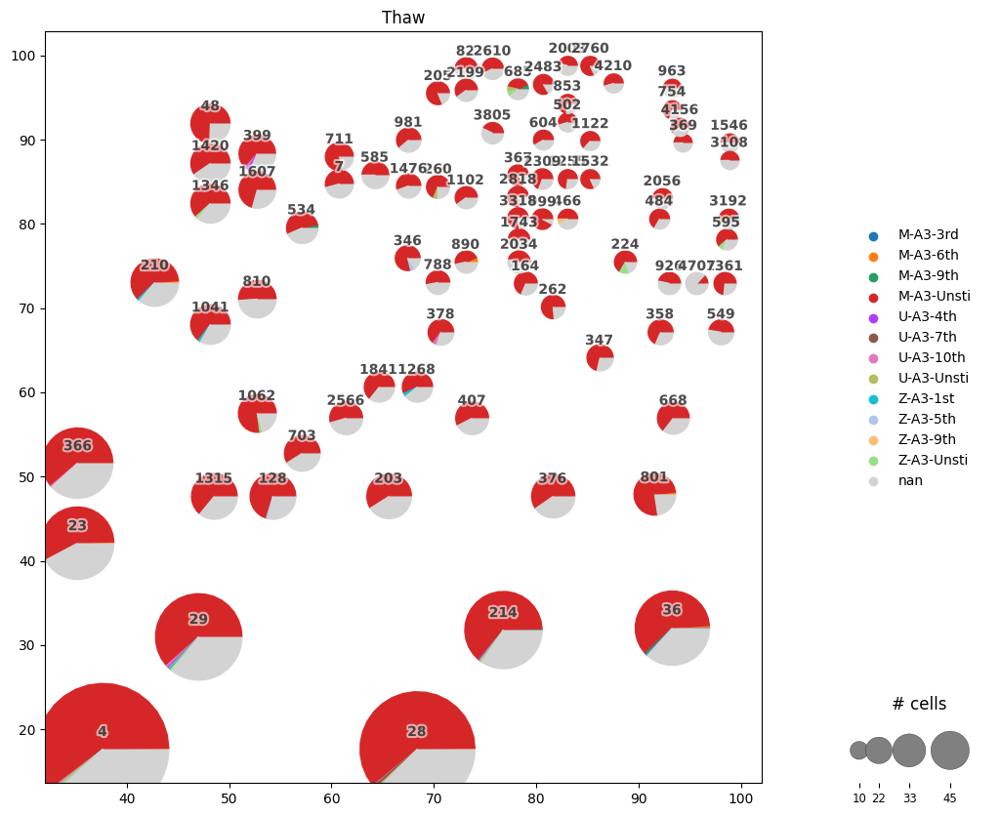

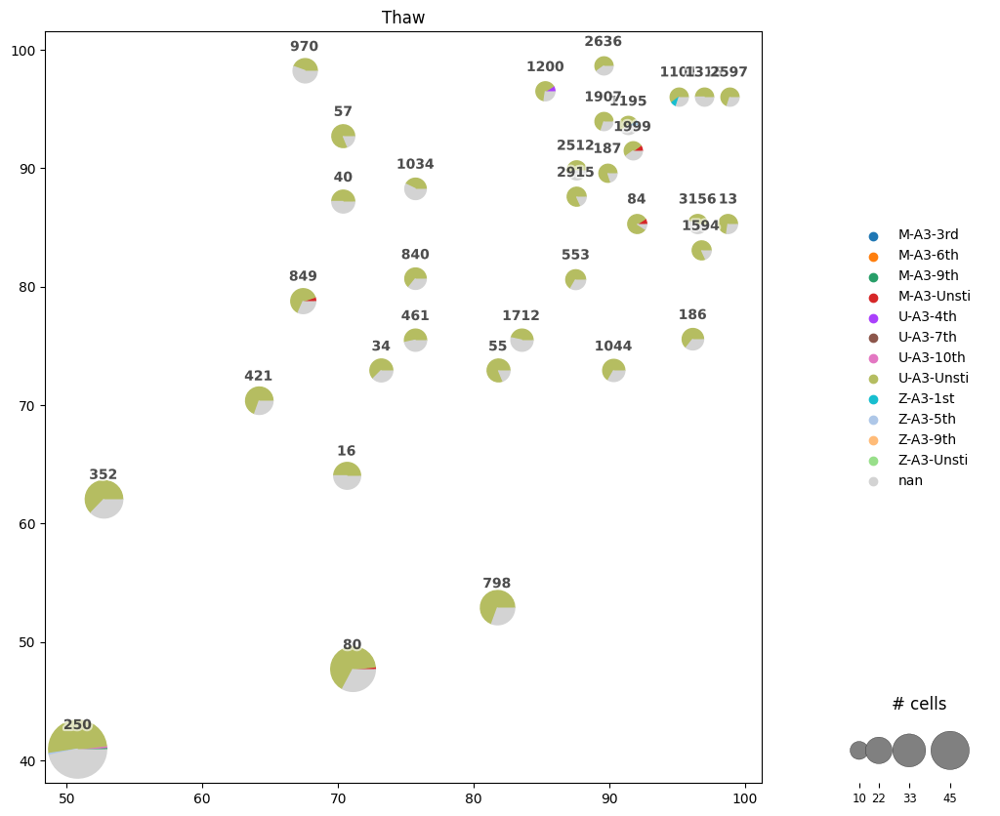

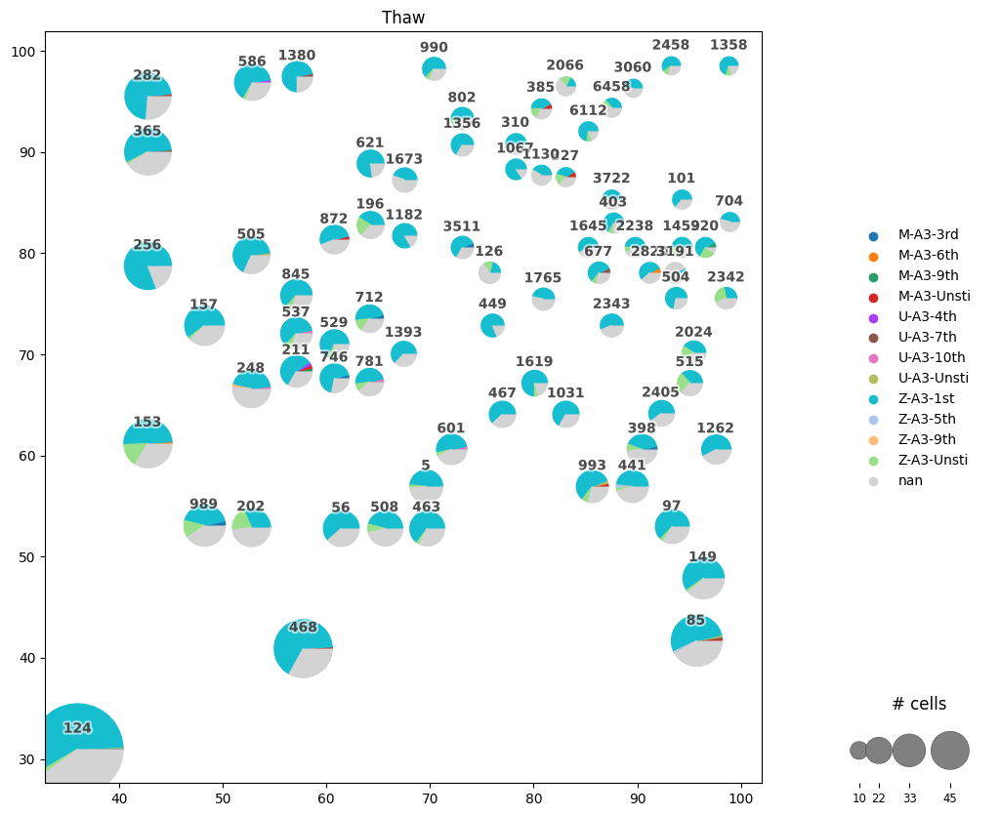

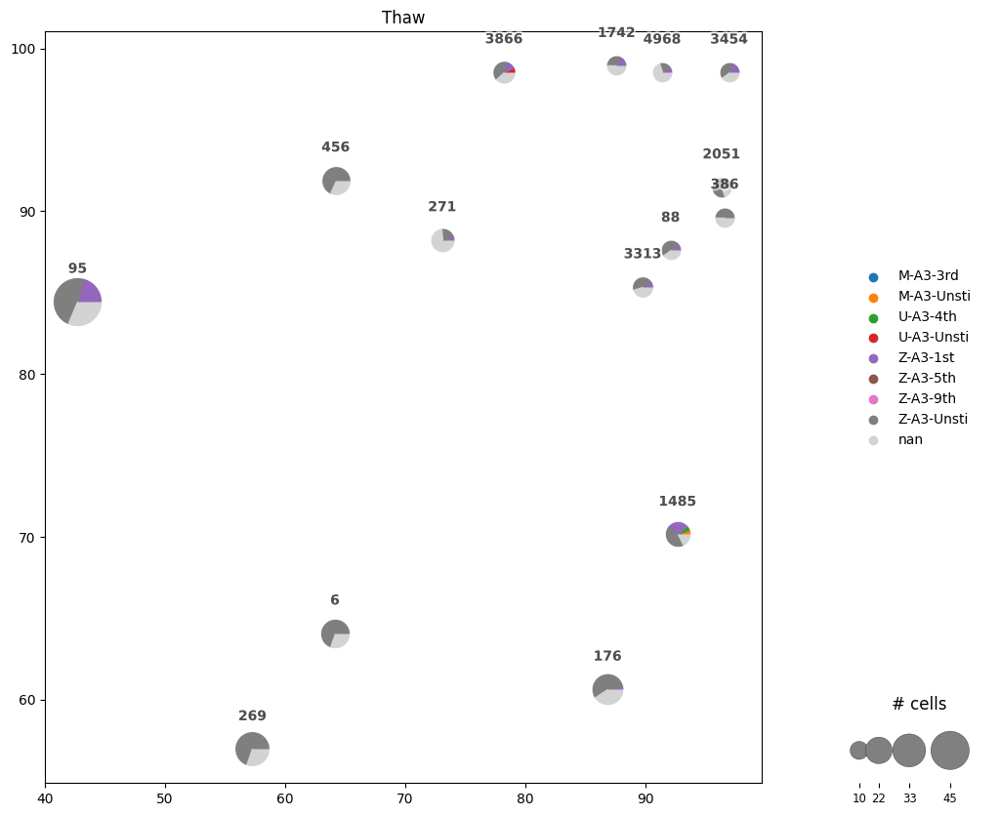

...

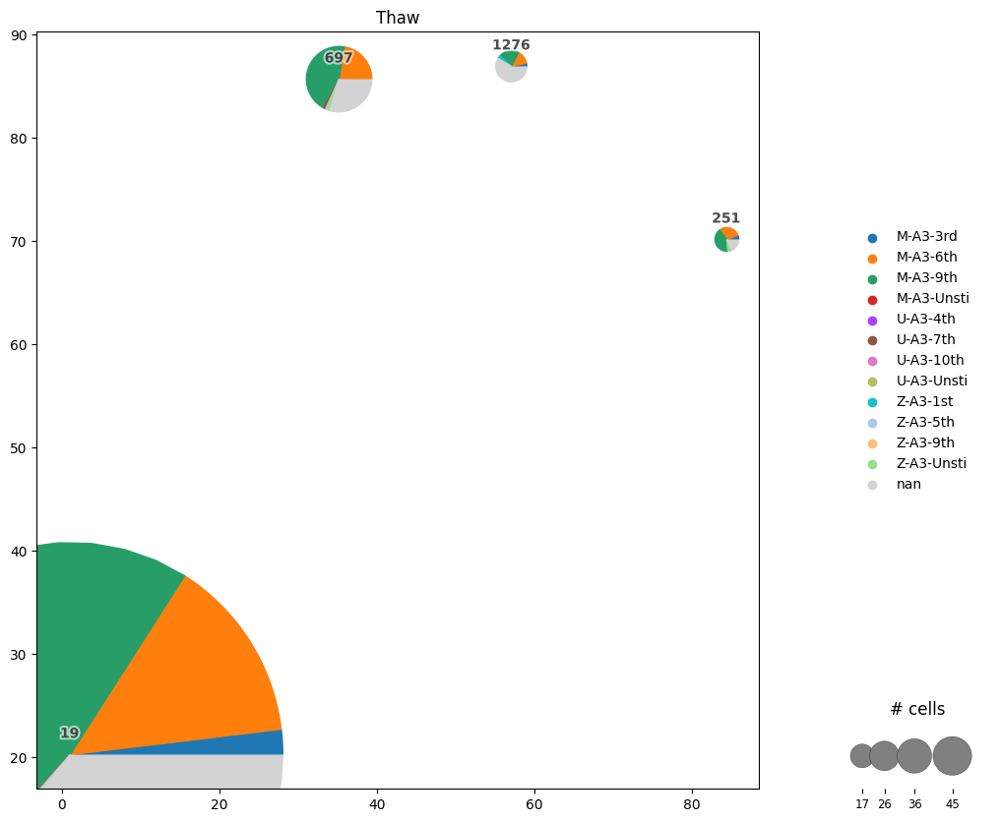

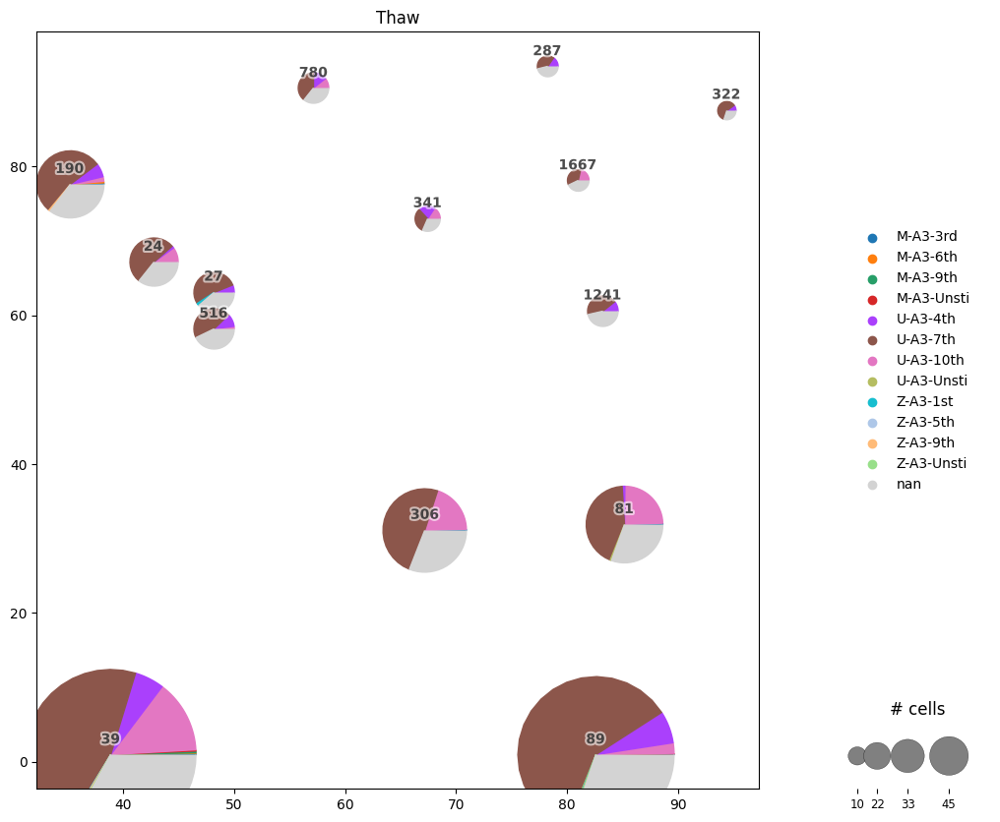

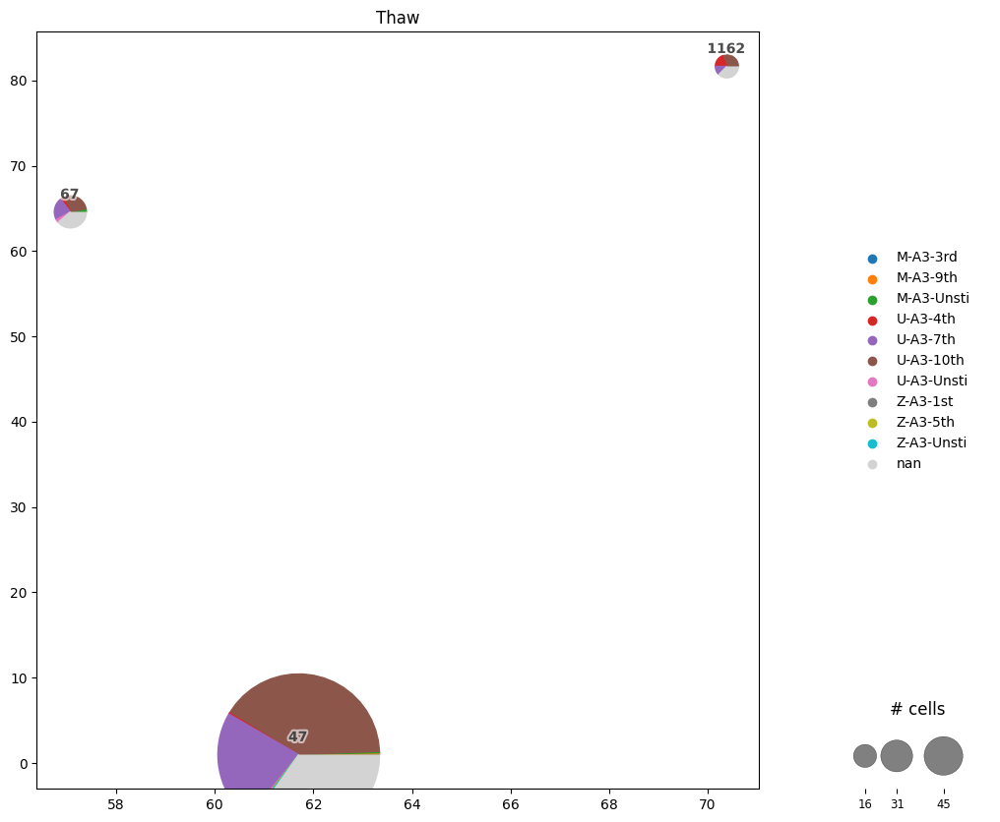

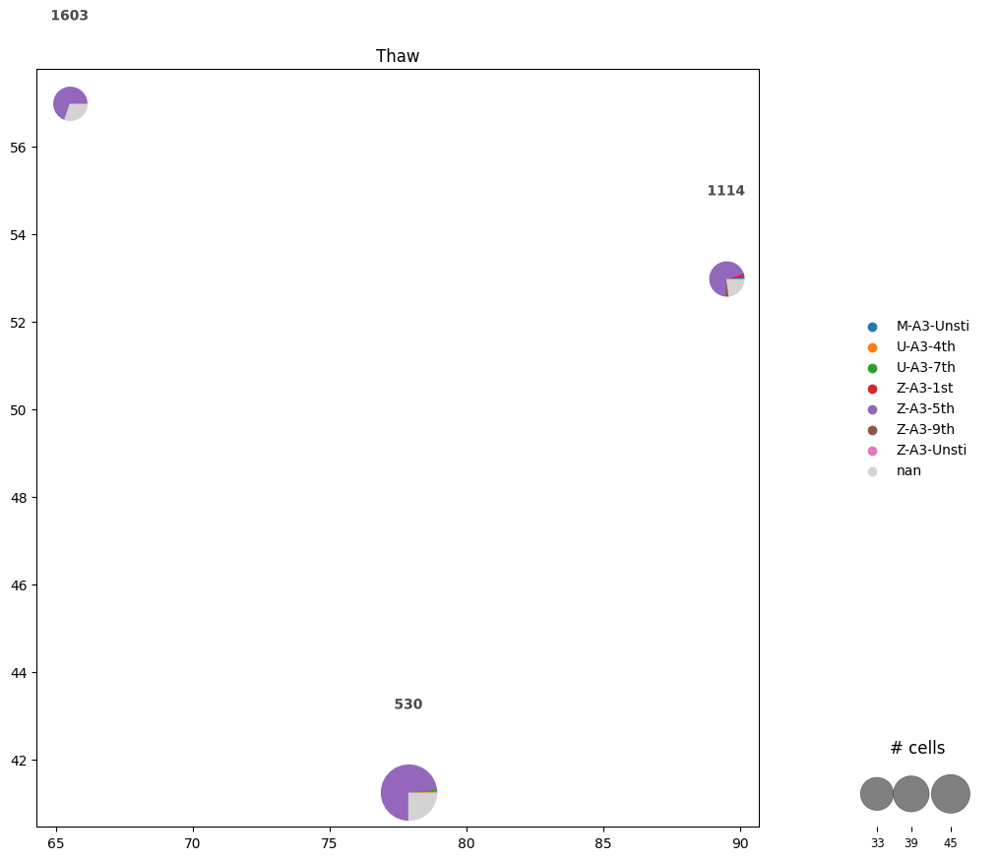

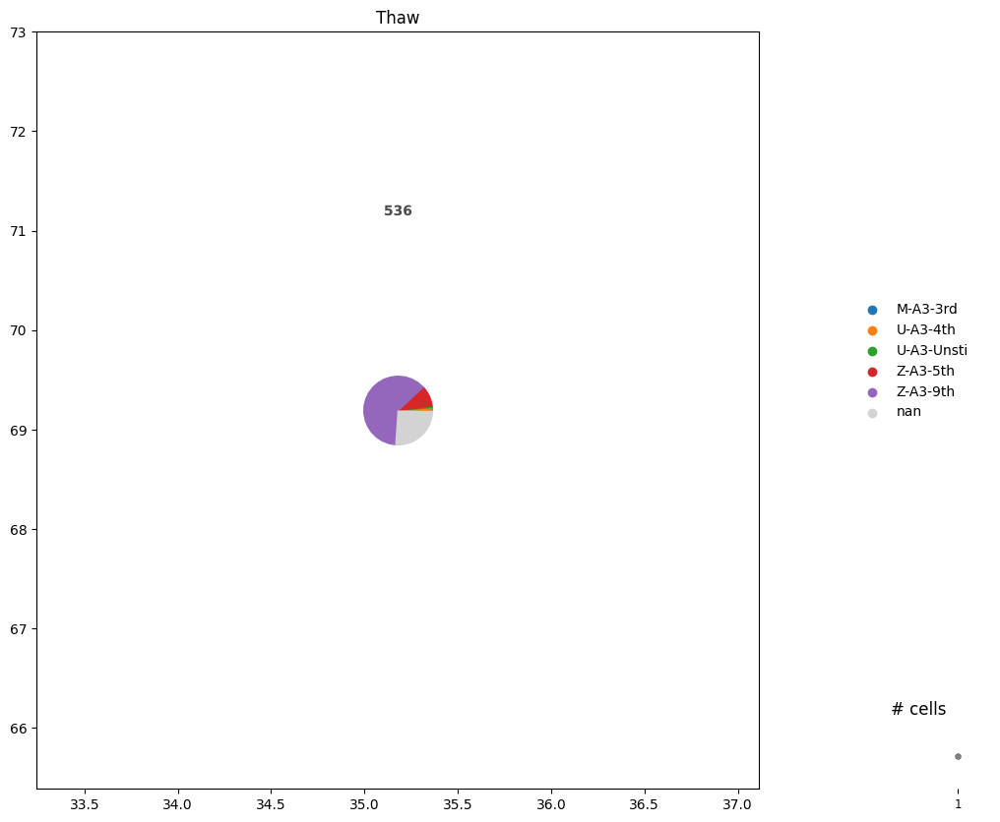

In [34]:
# this was a test to see if I could get predominant thaw and split into 12 graphs for TCR. Still has nan data. 

# Calculate the predominant Thaw for each clonotype
def get_predominant_thaw(x):
    try:
        return x.value_counts().index[0]
    except IndexError:
        return None

# Here we should use the TCR data (airr modality) to get the predominant Thaw for each clonotype
predominant_thaw = mdata["airr"].obs.groupby('clone_id')['Thaw'].agg(get_predominant_thaw)

# Map the predominant Thaw to each cell in the TCR data
mdata["airr"].obs['predominant_thaw'] = mdata["airr"].obs['clone_id'].map(predominant_thaw)

# Get the unique Thaws
thaws = mdata["airr"].obs['predominant_thaw'].unique()

# Generate separate plots for each Thaw
for thaw in thaws:
    if thaw is not None:  # Skip None
        subset = mdata["airr"][mdata["airr"].obs['predominant_thaw'] == thaw]
        if subset.obs.shape[0] > 0:  # Check that the subset has cells
            ir.pl.clonotype_network(
                subset, 
                color='Thaw'  # Use the correct color attribute if you want to color the network differently
            )




<Axes: >

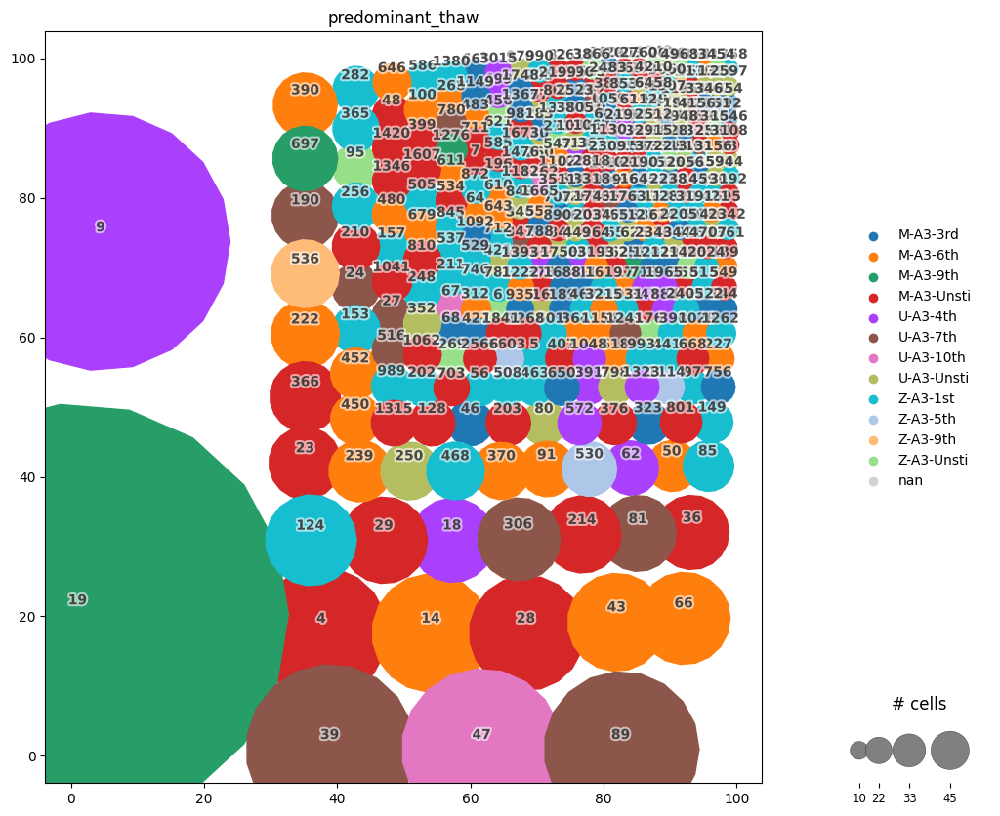

In [35]:
#was able to cut nan data but only shows predominant thaw. No distribution of thaws across clonotype

# Use the predominant_thaw mapping calculated earlier to associate each cell in the TCR data with its predominant Thaw
mdata["airr"].obs['predominant_thaw'] = mdata["airr"].obs['clone_id'].map(predominant_thaw)

# Generate the clonotype network plot for the TCR data, colored by their predominant Thaw
ir.pl.clonotype_network(
    mdata["airr"], 
    color='predominant_thaw'  # Color nodes by their predominant Thaw
)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


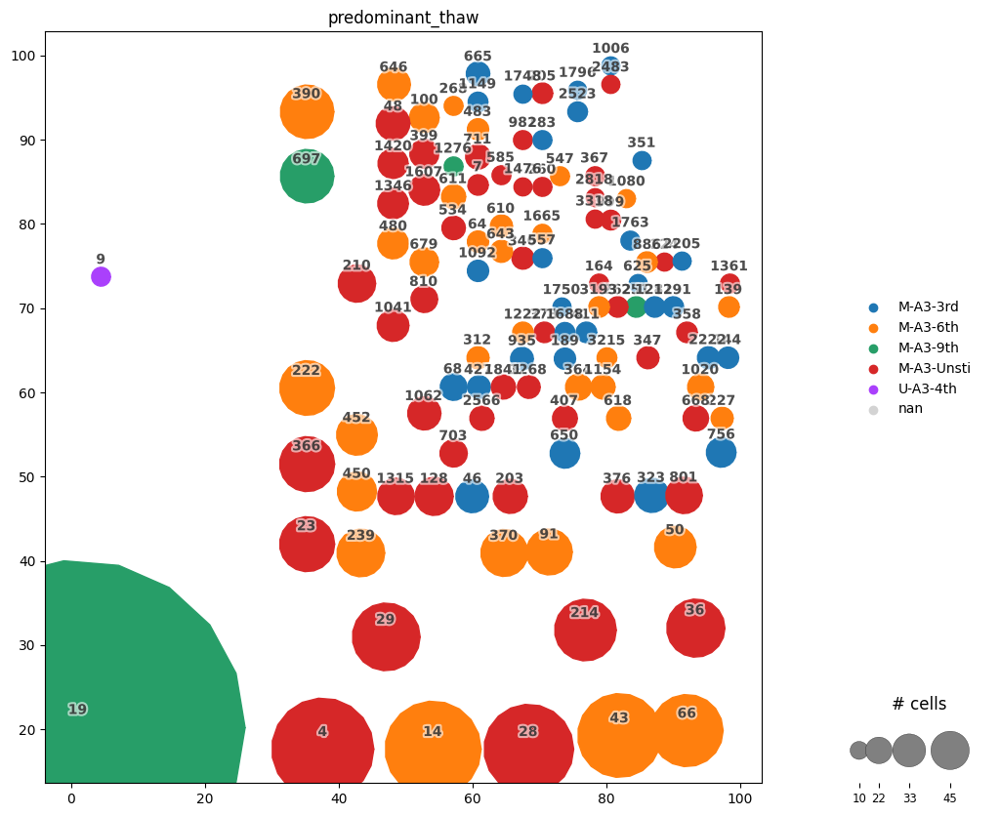

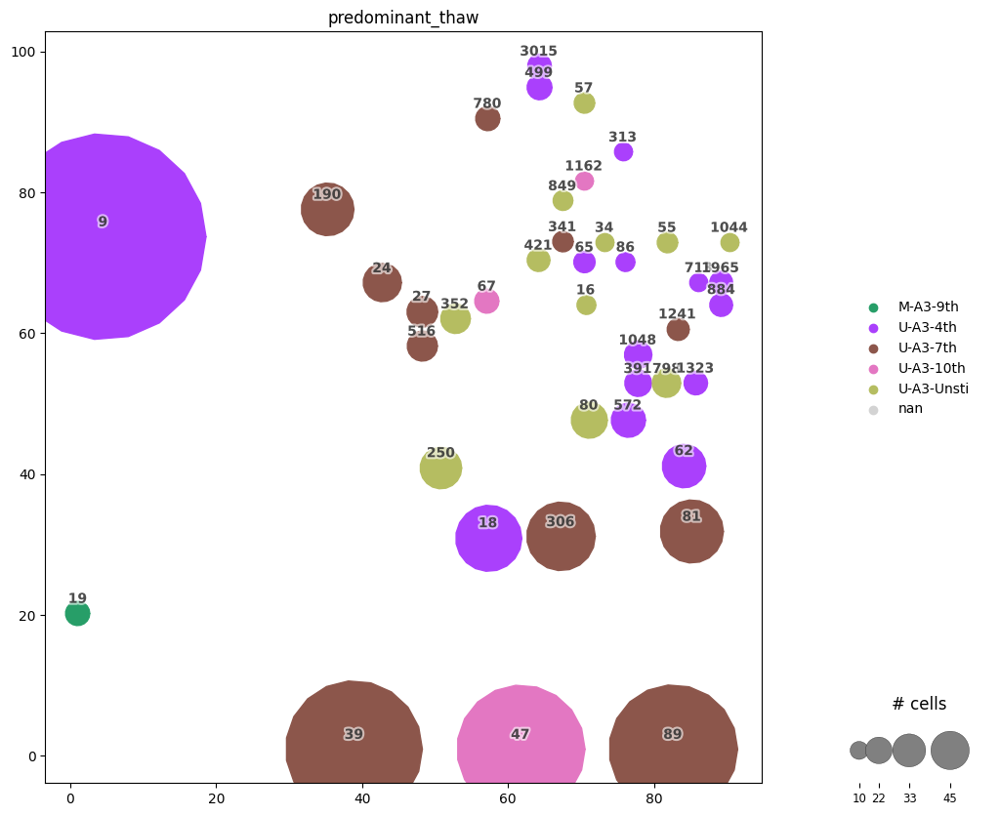

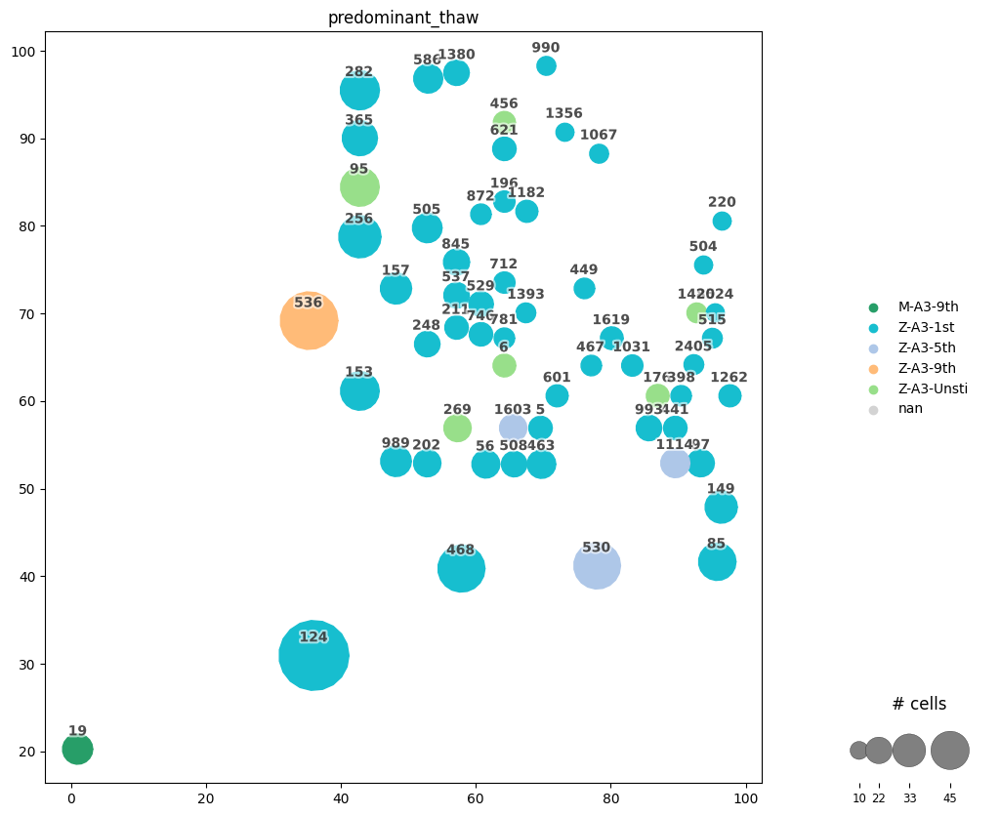

In [36]:
# Derive donor information from 'Thaw' column
mdata["airr"].obs['derived_donor'] = mdata["airr"].obs['Thaw'].str[0]

# List of unique donors
donors = mdata["airr"].obs['derived_donor'].unique()

# Generate separate clonotype network plots for each donor
for donor in donors:
    # Get the subset for the specific donor
    donor_subset = mdata["airr"][mdata["airr"].obs['derived_donor'] == donor]
    
    # Filter out clonotypes with fewer than 10 cells within this subset
    clonotype_counts_donor = donor_subset.obs['clone_id'].value_counts()
    valid_clonotypes_donor = clonotype_counts_donor[clonotype_counts_donor >= 10].index
    filtered_donor_subset = donor_subset[donor_subset.obs['clone_id'].isin(valid_clonotypes_donor)]
    
    # Generate the clonotype network plot for this filtered subset
    if filtered_donor_subset.obs.shape[0] > 0:  # Check that the subset has cells
        ir.pl.clonotype_network(
            filtered_donor_subset, 
            color='predominant_thaw'  # Color nodes by their predominant Thaw
        )


In [37]:
columns_in_obs = mdata["airr"].obs.columns
print(columns_in_obs)


Index(['high_confidence', 'is_cell', 'batch', 'receptor_type',
       'receptor_subtype', 'chain_pairing', 'clone_id', 'clone_id_size',
       'Thaw', 'derived_donor', 'predominant_thaw'],
      dtype='object')


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


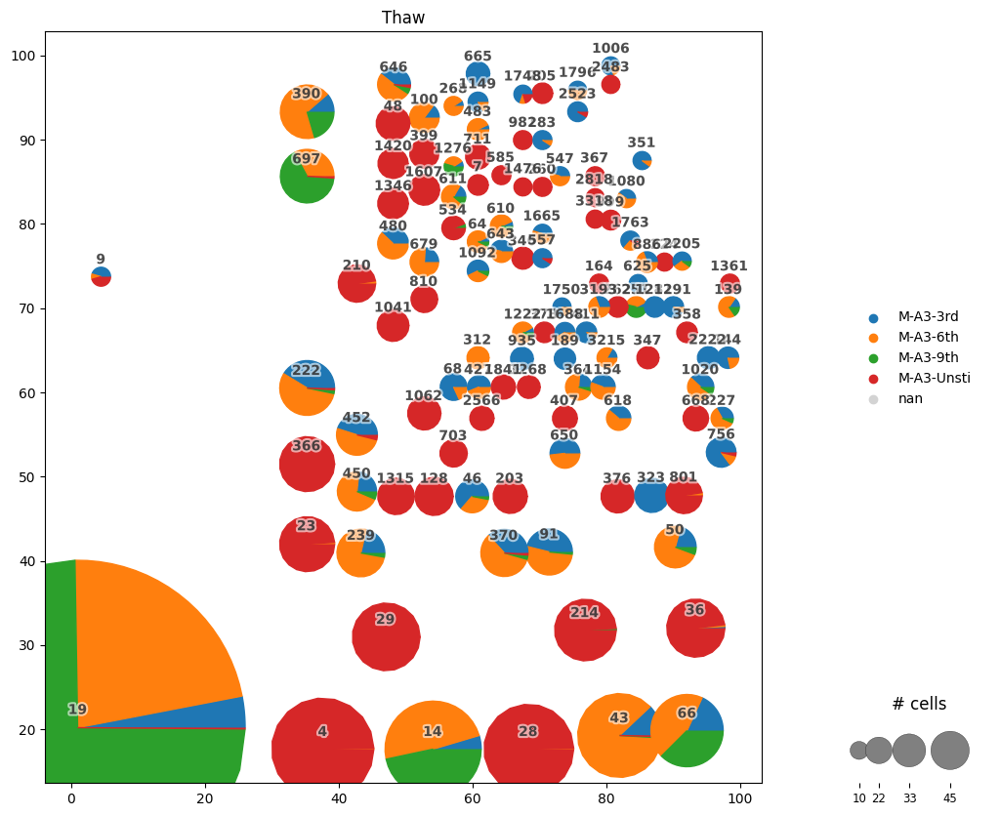

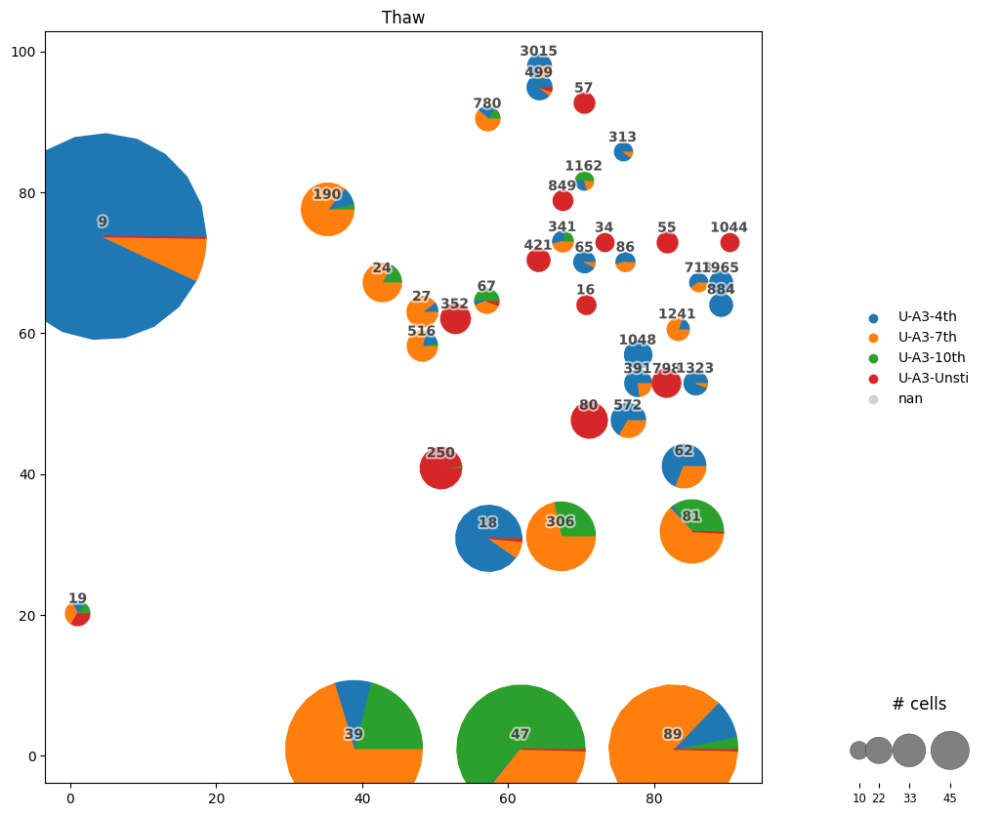

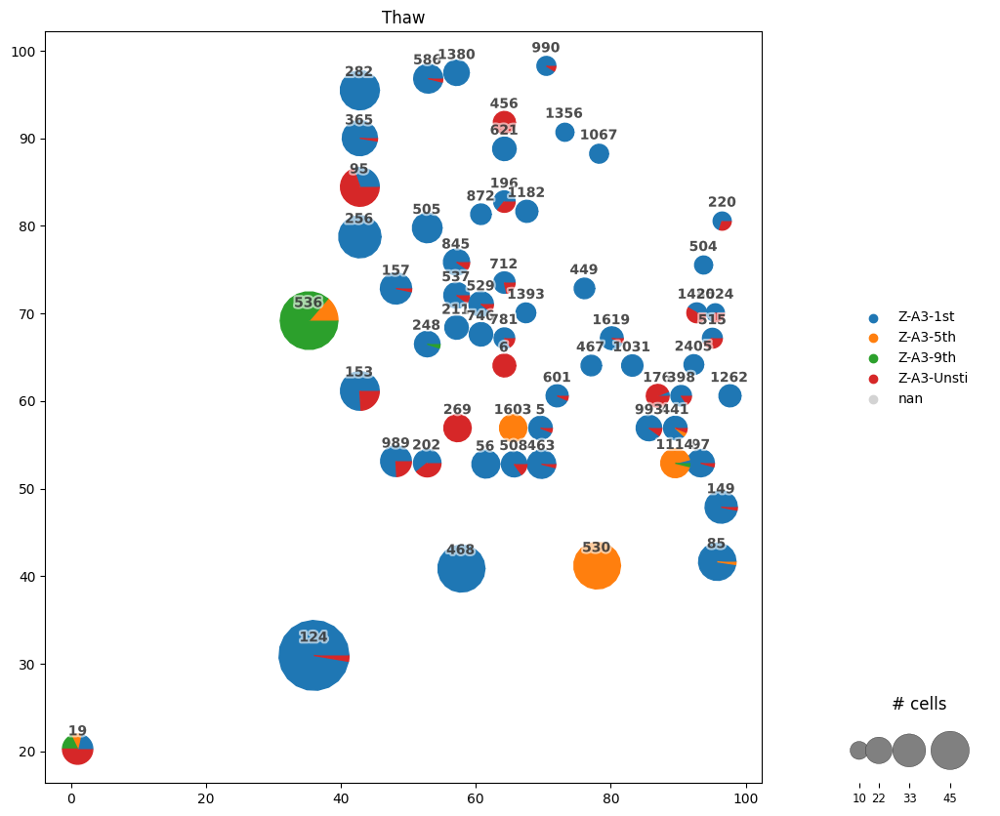

In [38]:
# Generate separate clonotype network plots for each donor
for donor in donors:
    # Get the subset for the specific donor
    donor_subset = mdata["airr"][mdata["airr"].obs['derived_donor'] == donor]
    
    # Filter out clonotypes with fewer than 10 cells within this subset and exclude nan values in Thaw
    clonotype_counts_donor = donor_subset.obs['clone_id'].value_counts()
    valid_clonotypes_donor = clonotype_counts_donor[clonotype_counts_donor >= 10].index
    filtered_donor_subset = donor_subset[donor_subset.obs['clone_id'].isin(valid_clonotypes_donor) & donor_subset.obs['Thaw'].notna()]
    
    # Generate the clonotype network plot for this filtered subset with pie charts showing distribution of Thaw
    if filtered_donor_subset.obs.shape[0] > 0:  # Check that the subset has cells
        ir.pl.clonotype_network(
            filtered_donor_subset, 
            color='Thaw'  # Color nodes by Thaw to represent distribution within each clonotype
        )



In [ ]:
print(mdata.obs.columns)

In [ ]:
# we don't have source, just use sample labels here
ir.pl.clonotype_network( # color='Thaw'
    mdata,color='gex:Sample') #, base_size=20, label_fontsize=9, panel_size=(7, 7)
#)

In [ ]:
# we don't have source, just use sample labels here
ir.pl.clonotype_network( # color='Thaw'
    mdata,color='gex:Time') #, base_size=20, label_fontsize=9, panel_size=(7, 7)
#)

In [ ]:
# re-compute the clonotype network based on amino-acid sequence similarity and 
# define clonotype clusters.
ir.pp.ir_dist(
    mdata,
    metric="alignment",
    sequence="aa", # tried 15, 25, 10, was garbage
    cutoff=10,# was 15, I would try 10 next -- definitely faster with the smaller number
)
ir.tl.define_clonotype_clusters(
    mdata, sequence="aa", metric="alignment", receptor_arms="all", dual_ir= "primary_only" #"any"
)


In [41]:
ir.tl.clonotype_network(mdata, min_cells=40, sequence="aa", metric="alignment")
ir.pl.clonotype_network(
    mdata, color="gex:Thaw", label_fontsize=9, panel_size=(7, 7), base_size=20
)
# again color by your labels, not theirs

ValueError: Connectivity data not found. Did you run `tl.define_clonotypes` or `tl.define_clonotype_clusters`, respectively?

In [ ]:
ir.tl.clonotype_network(mdata, min_cells=33, sequence="aa", metric="alignment")
ir.pl.clonotype_network(
    mdata, color="gex:Sample", label_fontsize=9, panel_size=(7, 7), base_size=20
)

In [ ]:
ir.tl.clonotype_network(mdata, min_cells=33, sequence="aa", metric="alignment")
ir.pl.clonotype_network(
    mdata, color="gex:Time", label_fontsize=9, panel_size=(7, 7), base_size=20
)

In [ ]:
mdata["airr"].obsm['airr']

In [42]:
mdata["airr"].obsm['chain_indices']

<Array [{multichain: False, VJ: ..., ...}, ...] type='40077 * {multichain: ...'>

In [69]:
# task 1 
# this is a little more complicated due to the nature of the data itself (these are not even scalars!)

# wants sample by TCR airr heatmap as one graph, 
# with hierarchical clustering on the opposing axises and colored by differential expression
sc.tl.rank_genes_groups(mdata["gex"], groupby='Thaw', method='wilcoxon')#, key_added = "wilcoxon")
#sc.pl.rank_genes_groups(mdata["gex"], n_genes=10, groupby='cluster')
#sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, key="thaw", groupby="louvain_0.6") 
# you can use this to give you mean expression in groups
sc.pl.rank_genes_groups_heatmap(mdata["gex"], 
                                n_genes=10, groupby='Thaw', show_gene_labels=True,) # save="heatmap.png")

KeyboardInterrupt: 

In [46]:
# create some mask on gex data to only have tcr receptor expression

mdata["gex"].var.gene_ids


AL627309.1    ENSG00000238009
AL627309.3    ENSG00000239945
AL627309.5    ENSG00000241860
AP006222.2    ENSG00000286448
LINC01409     ENSG00000237491
                   ...       
AC240274.1    ENSG00000271254
AC004556.3    ENSG00000276345
AC233755.2    ENSG00000277856
AC007325.4    ENSG00000278817
AC007325.2    ENSG00000277196
Name: gene_ids, Length: 28608, dtype: object

In [47]:
mdata["gex"].obs.Thaw 

AAACCTGAGACTAAGT-1        M-A3-3rd
AAACCTGAGAGGGATA-1        M-A3-6th
AAACCTGAGATGTAAC-1      Z-A3-Unsti
AAACCTGAGCAATCTC-1      M-A3-Unsti
AAACCTGAGCCCAGCT-1      U-A3-Unsti
                           ...    
TTTGTCATCACGATGT-1        M-A3-3rd
TTTGTCATCCGCGTTT-1        U-A3-7th
TTTGTCATCCTACAGA-1        M-A3-6th
TTTGTCATCGTCTGCT-1      U-A3-Unsti
TTTGTCATCTTGGGTA-1-1    M-A3-Unsti
Name: Thaw, Length: 47024, dtype: category
Categories (12, object): ['M-A3-3rd', 'M-A3-6th', 'M-A3-9th', 'M-A3-Unsti', ..., 'Z-A3-1st', 'Z-A3-5th', 'Z-A3-9th', 'Z-A3-Unsti']

In [48]:
len(mdata["gex"].obs[mdata["gex"].obs.Thaw == "Z-A3-1st"].index)

3895

In [49]:
mdata["prot"].var.gene_ids

Hu.CD101                                         ADT_C0944
Hu.CD103                                         ADT_C0145
Hu.CD105_43A3                                    ADT_C0068
Hu.CD107a                                        ADT_C0155
Hu.CD112                                         ADT_C0024
                                                   ...    
TotalSeq-C0258 anti-human Hashtag 8 Antibody             8
TotalSeq-C0259 anti-human Hashtag 9 Antibody             9
TotalSeq-C0260 anti-human Hashtag 10 Antibody           10
TotalSeq-C0262 anti-human Hashtag 12 Antibody           12
TotalSeq-C0263 anti-human Hashtag 13 Antibody           13
Name: gene_ids, Length: 149, dtype: object

In [50]:
"ADT_C0090" in list(mdata["prot"].var.gene_ids)
#just do the second paper's qc and redo all the protein + gex stuff
# MouseIgG1, MouseIgG2a, MouseIgG2b, RatIgG2b, RatIgG1, RatIgG2a, and HamsterIgG
# C0090, C0091, C0092, C0095
# match these to ADT tags based on the file Xiao gave you

True

In [106]:
print(mdata["prot"].obs.columns)


Index(['batch', 'percent_mito', 'n_counts', 'n_features', 'louvain',
       'num_isotype_flags',
       'TotalSeq-C0251 anti-human Hashtag 1 Antibody_binding',
       'TotalSeq-C0252 anti-human Hashtag 2 Antibody_binding',
       'TotalSeq-C0253 anti-human Hashtag 3 Antibody_binding',
       'TotalSeq-C0254 anti-human Hashtag 4 Antibody_binding',
       'TotalSeq-C0255 anti-human Hashtag 5 Antibody_binding',
       'TotalSeq-C0256 anti-human Hashtag 6 Antibody_binding',
       'TotalSeq-C0257 anti-human Hashtag 7 Antibody_binding',
       'TotalSeq-C0258 anti-human Hashtag 8 Antibody_binding',
       'TotalSeq-C0259 anti-human Hashtag 9 Antibody_binding',
       'TotalSeq-C0260 anti-human Hashtag 10 Antibody_binding',
       'TotalSeq-C0262 anti-human Hashtag 12 Antibody_binding',
       'TotalSeq-C0263 anti-human Hashtag 13 Antibody_binding',
       'TotalSeq-C0251 anti-human Hashtag 1 Antibody_specificity',
       'TotalSeq-C0252 anti-human Hashtag 2 Antibody_specificity',
       'To

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


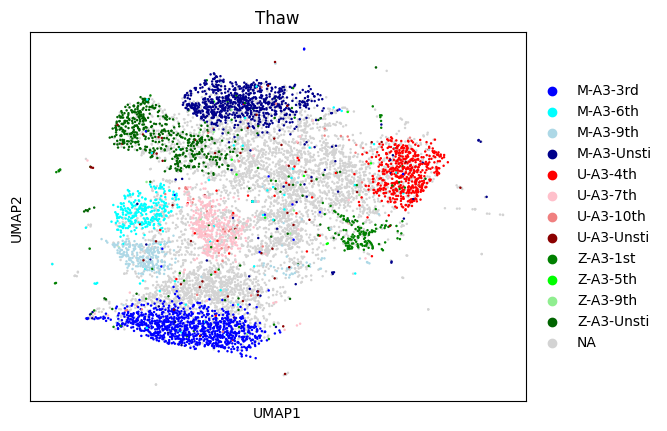

In [112]:


sc.tl.umap(mdata["prot"])
sc.pl.umap(mdata["prot"], color='Thaw',) # save="UMAP.png")

In [113]:
# Count the number of 'na' entries in the 'Thaw' column
na_count = mdata["prot"].obs['Thaw'].isna().sum()

# Print the detailed explanation
print(f"Out of the {len(mdata['prot'].obs)} cells in the protein dataset, {na_count} cells have 'na' as their 'Thaw' value.")
print("\nExplanation:")
print("The 'na' dots on the UMAP plot represent cells from the protein dataset that do not have associated 'Thaw' information.")
print("This can occur if there is a discrepancy between the cells in the protein dataset and the gene expression dataset from which the 'Thaw' information was originally sourced.")
print("In other words, these 'na' cells in the protein dataset do not have corresponding cells in the gene expression dataset with 'Thaw' information.")


Out of the 9502 cells in the protein dataset, 5231 cells have 'na' as their 'Thaw' value.

Explanation:
The 'na' dots on the UMAP plot represent cells from the protein dataset that do not have associated 'Thaw' information.
This can occur if there is a discrepancy between the cells in the protein dataset and the gene expression dataset from which the 'Thaw' information was originally sourced.
In other words, these 'na' cells in the protein dataset do not have corresponding cells in the gene expression dataset with 'Thaw' information.


In [52]:
mdata["gex"]

AnnData object with n_obs × n_vars = 47024 × 28608
    obs: 'TotalSeq-C0251 anti-human Hashtag 1 Antibody', 'TotalSeq-C0252 anti-human Hashtag 2 Antibody', 'TotalSeq-C0253 anti-human Hashtag 3 Antibody', 'TotalSeq-C0254 anti-human Hashtag 4 Antibody', 'TotalSeq-C0255 anti-human Hashtag 5 Antibody', 'TotalSeq-C0256 anti-human Hashtag 6 Antibody', 'TotalSeq-C0257 anti-human Hashtag 7 Antibody', 'TotalSeq-C0258 anti-human Hashtag 8 Antibody', 'TotalSeq-C0259 anti-human Hashtag 9 Antibody', 'TotalSeq-C0260 anti-human Hashtag 10 Antibody', 'TotalSeq-C0262 anti-human Hashtag 12 Antibody', 'TotalSeq-C0263 anti-human Hashtag 13 Antibody', 'most_likely_hypothesis', 'cluster_feature', 'negative_hypothesis_probability', 'singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification', 'Thaw', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'feature_

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


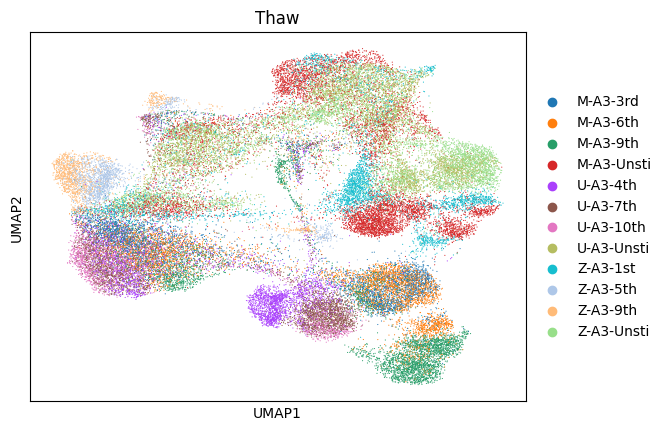

In [53]:
sc.tl.umap(mdata["gex"])
sc.pl.umap(mdata["gex"], color='Thaw',)

In [54]:
mdata["gex"]

AnnData object with n_obs × n_vars = 47024 × 28608
    obs: 'TotalSeq-C0251 anti-human Hashtag 1 Antibody', 'TotalSeq-C0252 anti-human Hashtag 2 Antibody', 'TotalSeq-C0253 anti-human Hashtag 3 Antibody', 'TotalSeq-C0254 anti-human Hashtag 4 Antibody', 'TotalSeq-C0255 anti-human Hashtag 5 Antibody', 'TotalSeq-C0256 anti-human Hashtag 6 Antibody', 'TotalSeq-C0257 anti-human Hashtag 7 Antibody', 'TotalSeq-C0258 anti-human Hashtag 8 Antibody', 'TotalSeq-C0259 anti-human Hashtag 9 Antibody', 'TotalSeq-C0260 anti-human Hashtag 10 Antibody', 'TotalSeq-C0262 anti-human Hashtag 12 Antibody', 'TotalSeq-C0263 anti-human Hashtag 13 Antibody', 'most_likely_hypothesis', 'cluster_feature', 'negative_hypothesis_probability', 'singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification', 'Thaw', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'feature_

In [55]:
# List the unique categories in the filtered 'Thaw' column
filtered_unique_thaw_categories = mdata["airr"].obs['Thaw'].cat.categories
print(filtered_unique_thaw_categories)


Index(['M-A3-3rd', 'M-A3-6th', 'M-A3-9th', 'M-A3-Unsti', 'U-A3-4th',
       'U-A3-7th', 'U-A3-10th', 'U-A3-Unsti', 'Z-A3-1st', 'Z-A3-5th',
       'Z-A3-9th', 'Z-A3-Unsti'],
      dtype='object')


<Axes: >

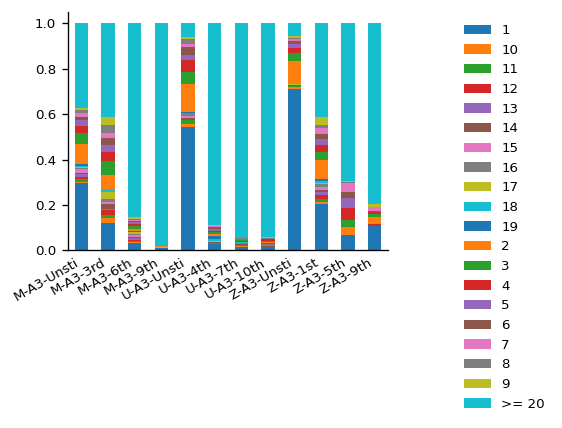

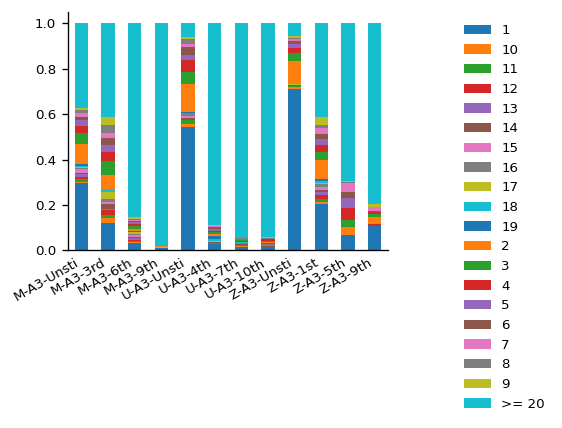

In [57]:
# Define the desired order
desired_order = [
    "M-A3-Unsti", "M-A3-3rd", "M-A3-6th", "M-A3-9th", 
    "U-A3-Unsti", "U-A3-4th", "U-A3-7th", "U-A3-10th", 
    "Z-A3-Unsti", "Z-A3-1st", "Z-A3-5th", "Z-A3-9th"
]

# Reorder the 'gex:Thaw' category based on the desired order
mdata.obs["gex:Thaw"] = mdata.obs["gex:Thaw"].astype('category')
mdata.obs["gex:Thaw"] = mdata.obs["gex:Thaw"].cat.reorder_categories(desired_order)

# Plot the data
ir.pl.clonal_expansion(
    mdata, target_col="clone_id", clip_at=20, groupby="gex:Thaw"
)

# Plot normalized data
ir.pl.clonal_expansion(
    mdata, target_col="clone_id", clip_at=20, normalize=True, groupby="gex:Thaw"
)


In [58]:
# Check for categories in `desired_order` that are not in `mdata.obs["gex:Thaw"]`
missing_categories = set(desired_order) - set(mdata.obs["gex:Thaw"].cat.categories)
print("Missing categories:", missing_categories)

# Check for categories in `mdata.obs["gex:Thaw"]` that are not in `desired_order`
extra_categories = set(mdata.obs["gex:Thaw"].cat.categories) - set(desired_order)
print("Extra categories:", extra_categories)


Missing categories: set()
Extra categories: set()


In [59]:
# task 2
# we must be missing a thaw label

# UMAP from protein data, where the clusters are colored by sample name
# create a new column called Sample that applies the predefined sample map
thaw_to_donor = {
    'Z-A3-Unsti' : "Z",
    'Z-A3-1st' : "Z", 
    'Z-A3-5th' : "Z",  
    'Z-A3-9th' : "Z",    
    "M-A3-Unsti" : "M",  
    "M-A3-3rd" : "M",
    "M-A3-6th": "M",
    "M-A3-9th" : "M",
    "U-A3-Unsti" : "U",
    "U-A3-4th" : "U",
    "U-A3-7th": "U",
    "U-A3-10th": "U"
}
# U-A3-Unsti is not getting picked up here

# [print(i)for i in mdata["prot"].obs['Thaw'].unique()]
# raise Error
mdata["prot"].obs["Sample"] = mdata["prot"].obs['Thaw'].map(thaw_to_donor)
mdata["gex"].obs["Sample"] = mdata["gex"].obs['Thaw'].map(thaw_to_donor)

Z, M, U = mdata["gex"][mdata["gex"].obs.Sample == "Z"], mdata["gex"][mdata["gex"].obs.Sample == "M"], mdata["gex"][mdata["gex"].obs.Sample == "U"]
sc.tl.umap(Z)
sc.pl.umap(Z, color='Thaw',) # save="UMAP.png")
sc.tl.umap(M)
sc.pl.umap(M, color='Thaw',) # save="UMAP.png")
sc.tl.umap(U)
sc.pl.umap(U, color='Thaw',) # save="UMAP.png")

KeyError: 'Thaw'

In [ ]:
columns_in_filtered_data = filtered_data.obs.columns
print(columns_in_filtered_data)


In [ ]:
# Extract the indices from mdata["airr"] where 'Thaw' is "M-A3-9th" and 'clone_id' is '19'
selected_indices = mdata["airr"].obs[(mdata["airr"].obs['Thaw'] == "M-A3-9th") & (mdata["airr"].obs['clone_id'] == '19')].index

# Use these indices to filter mdata["gex"]
filtered_data = mdata["gex"][mdata["gex"].obs.index.isin(selected_indices)]

# Generate and plot the UMAP
sc.tl.umap(filtered_data)
sc.pl.umap(filtered_data, color='Thaw')




In [ ]:
mdata["airr"].obs.columns


No data for Thaw M-A3-Uns in clonotype 19.


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


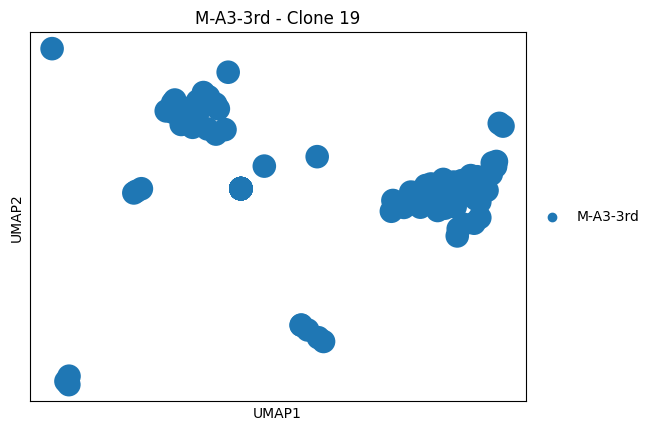

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


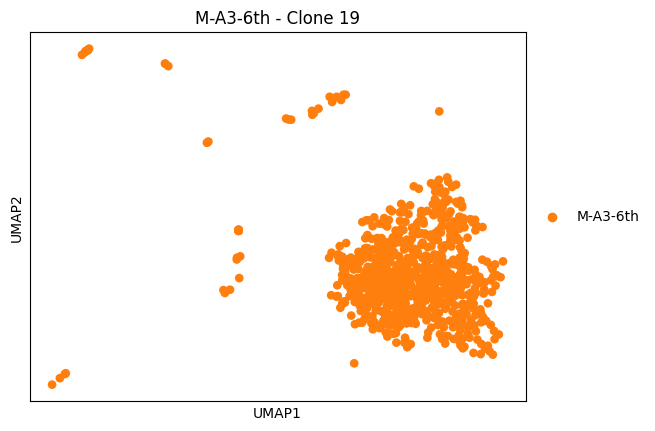

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


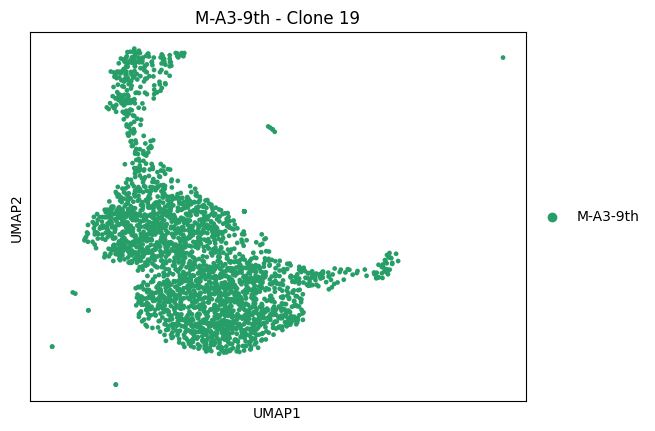

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


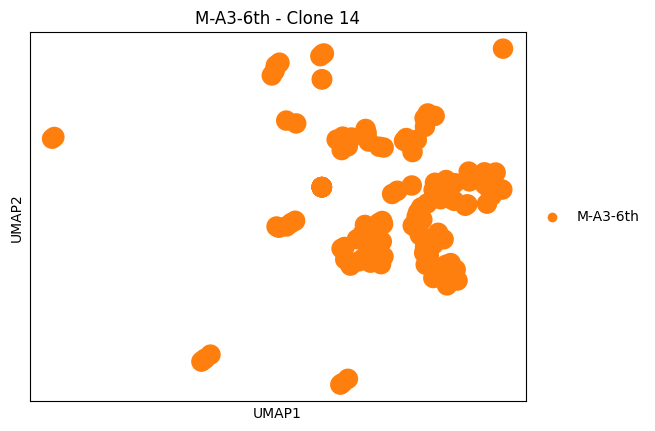

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


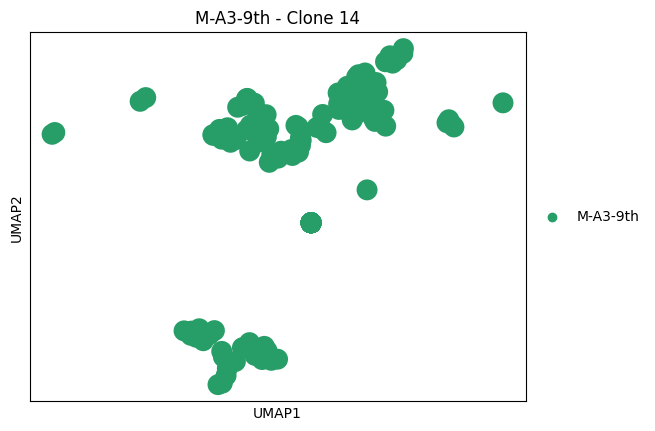

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


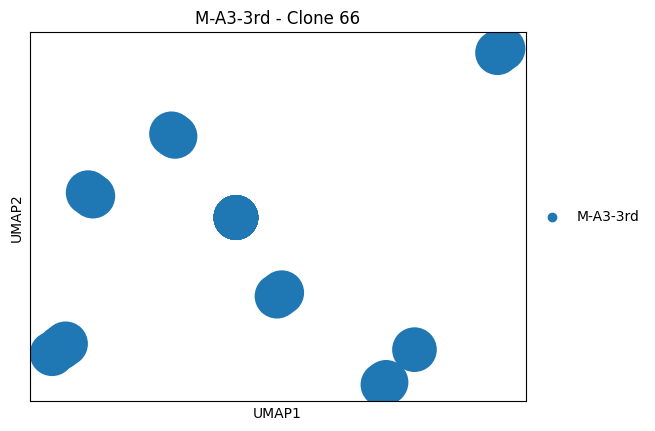

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


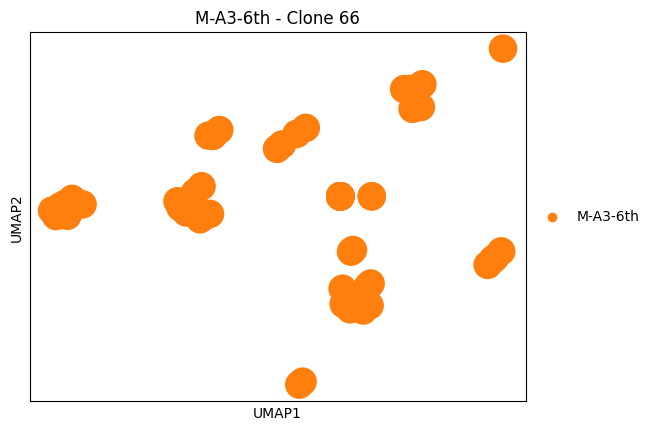

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


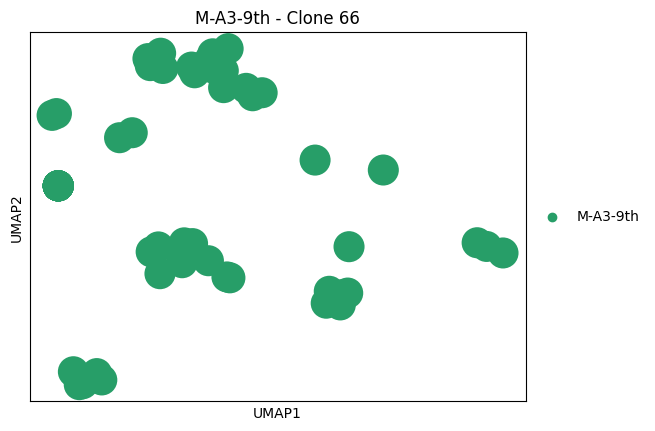

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


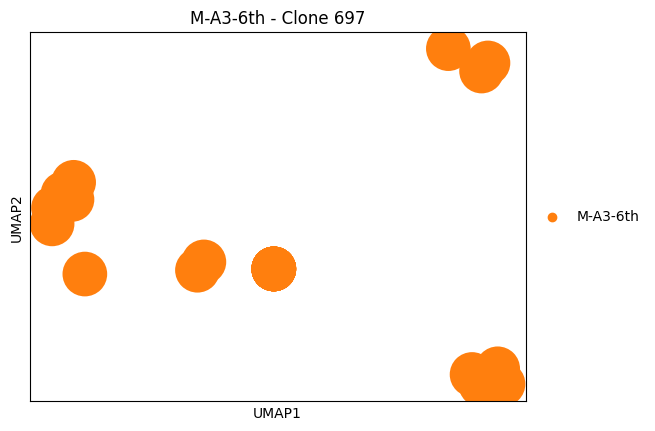

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


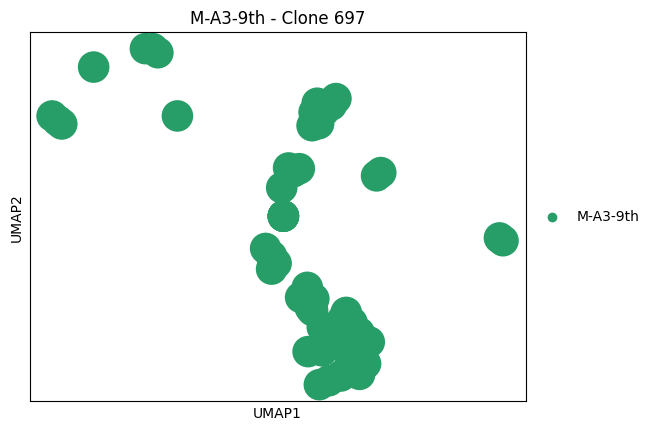

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


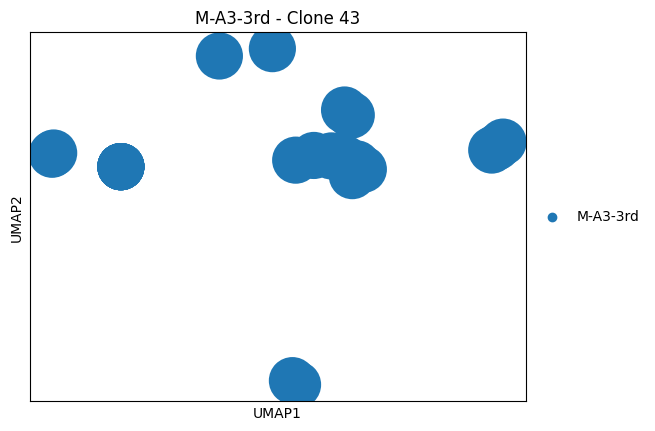

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


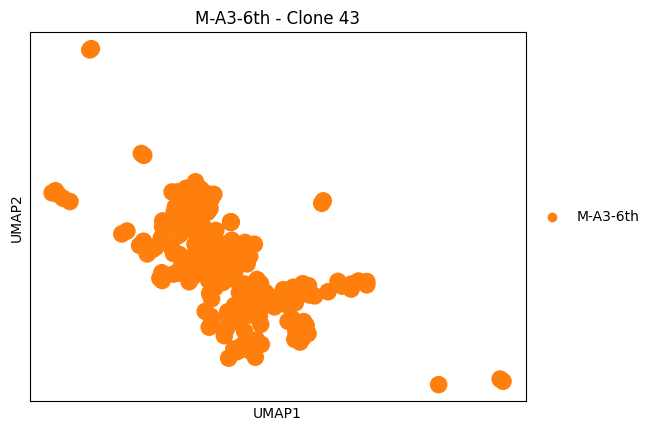

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


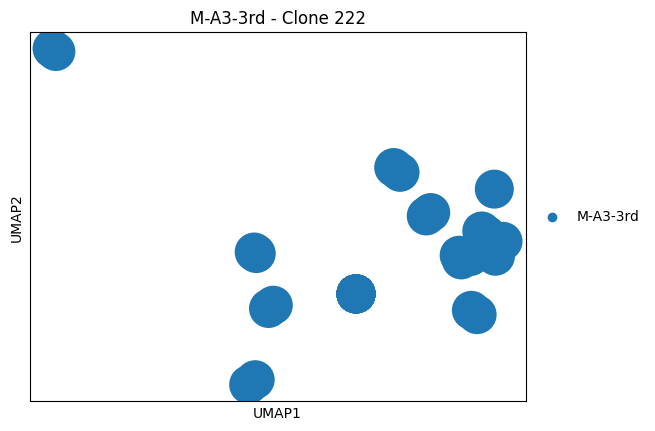

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


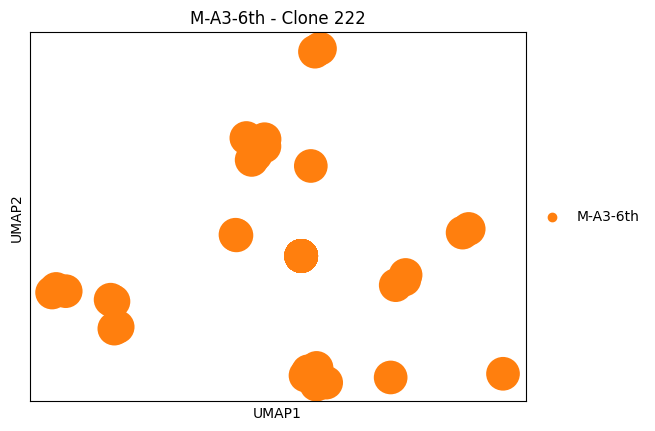

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


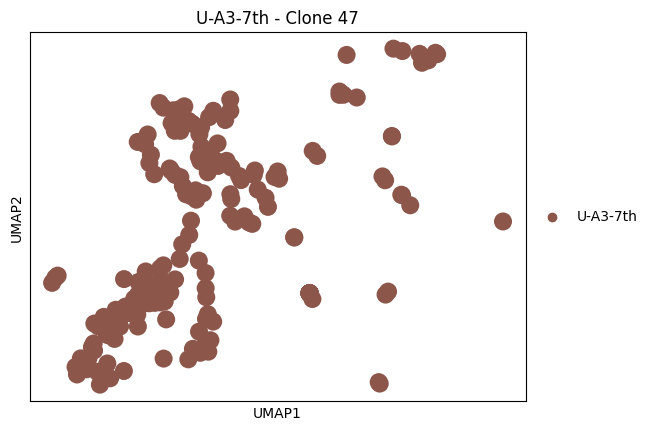

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


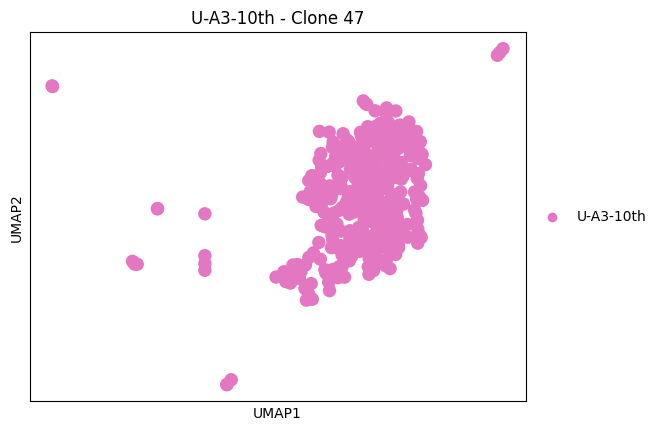

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


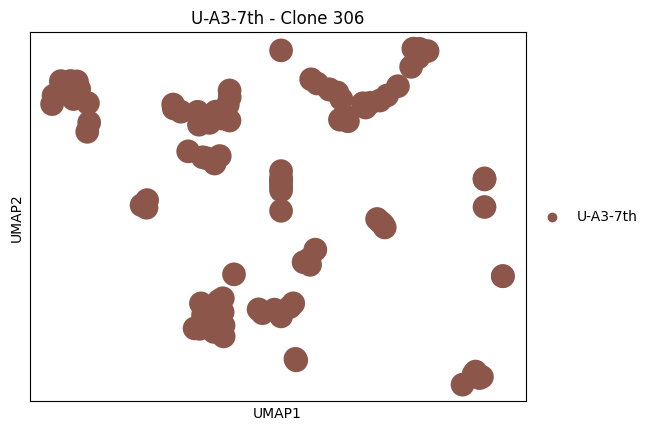

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


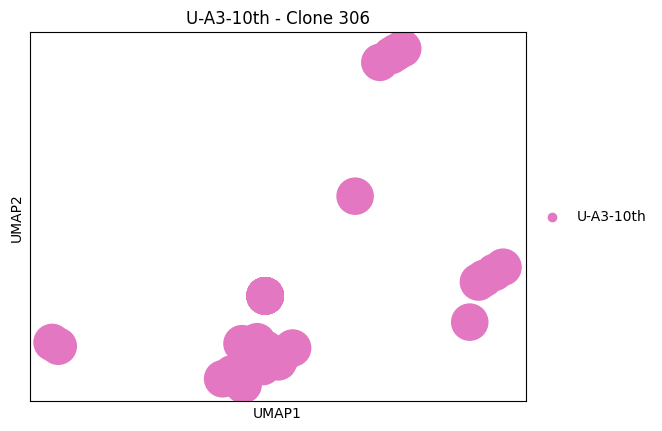

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


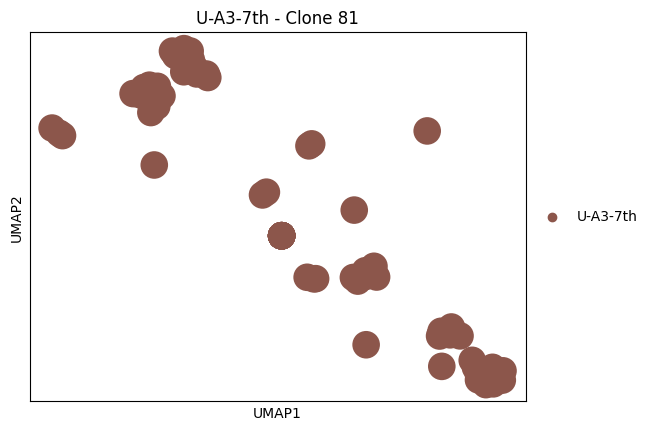

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


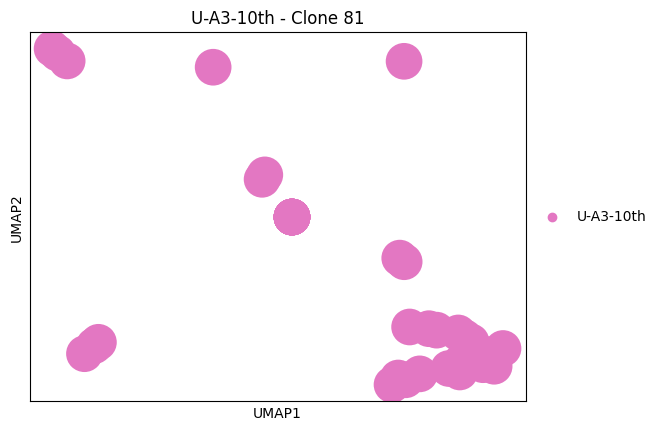

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


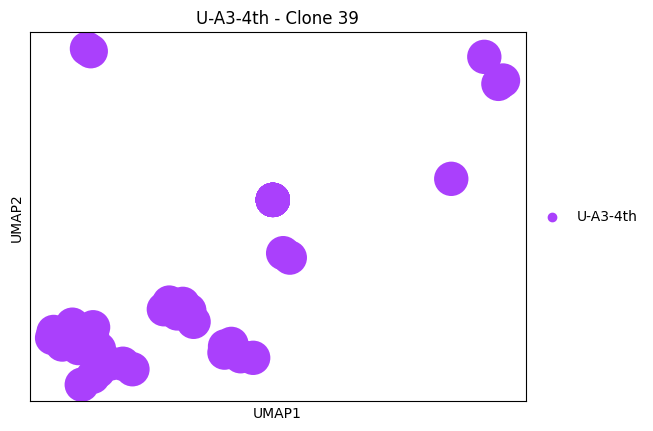

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


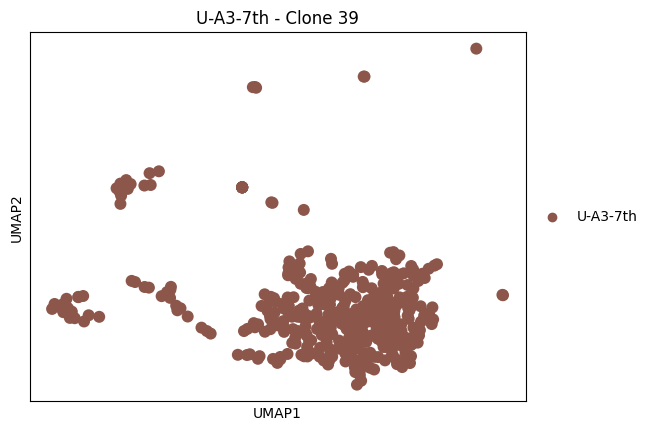

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


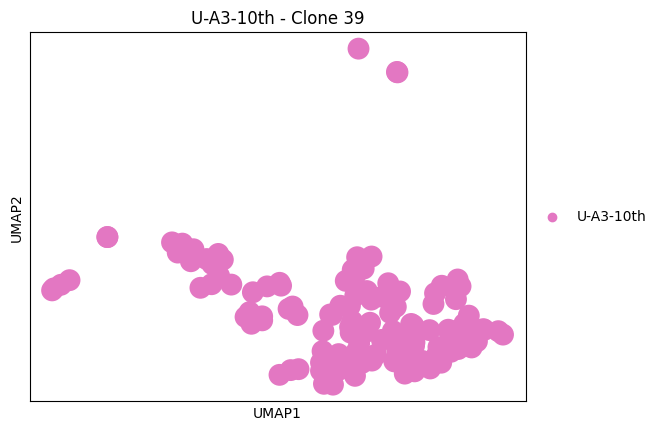

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


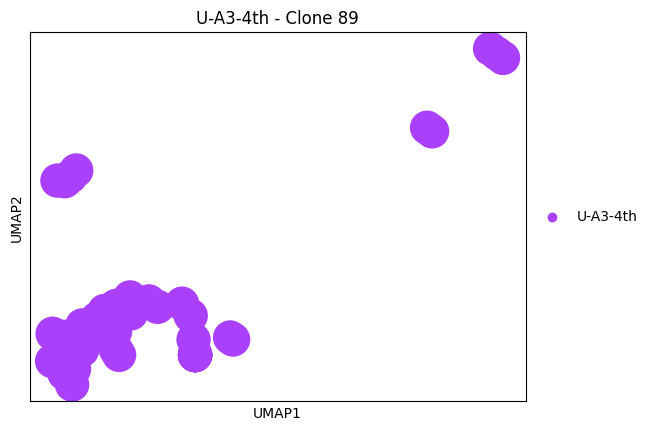

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


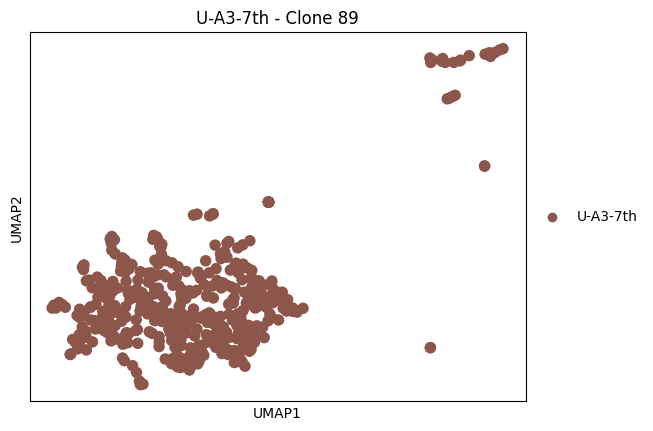

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


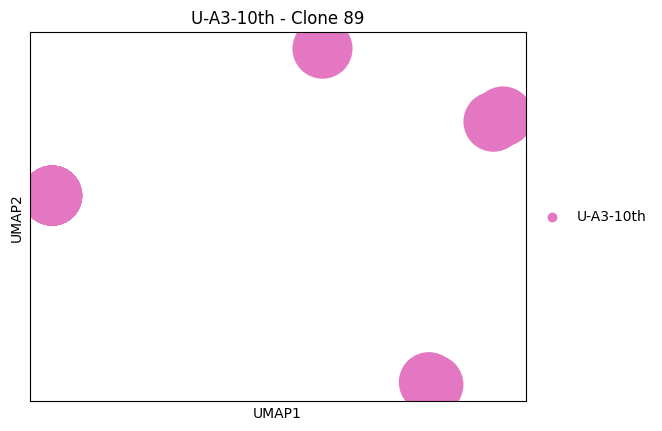

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


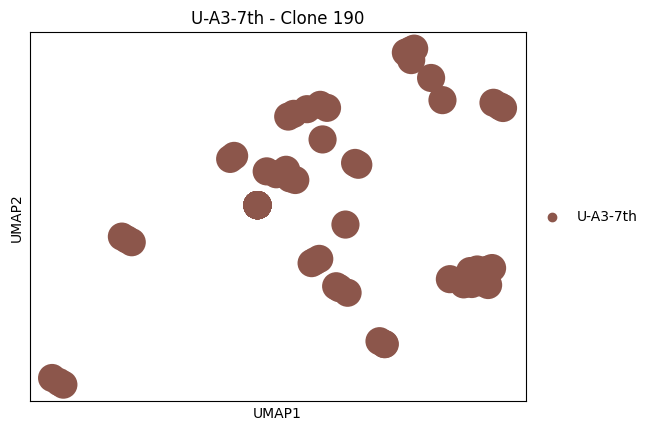

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


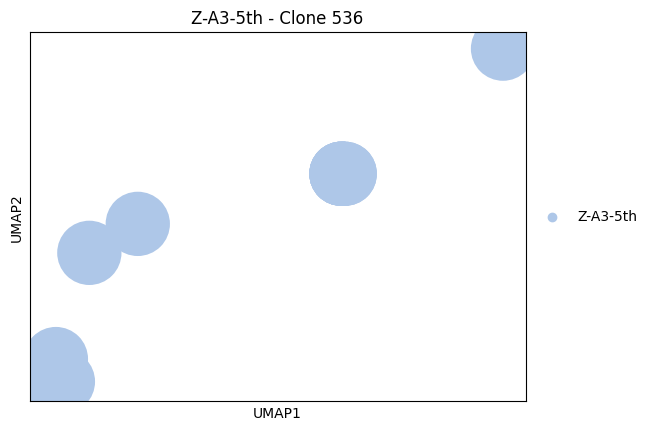

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


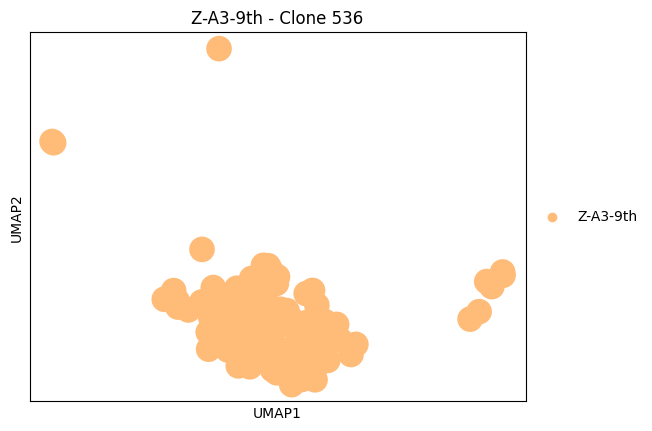

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


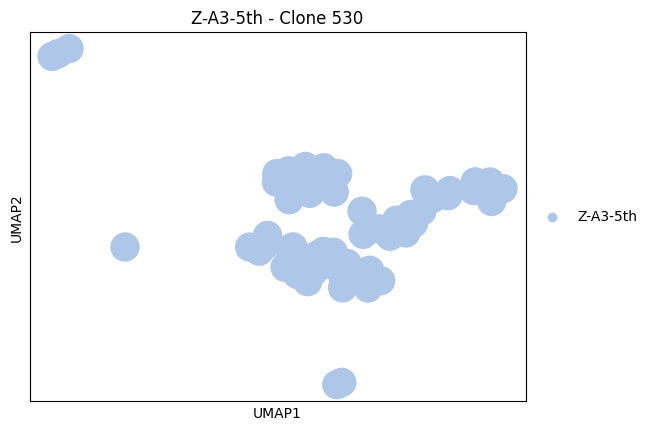

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


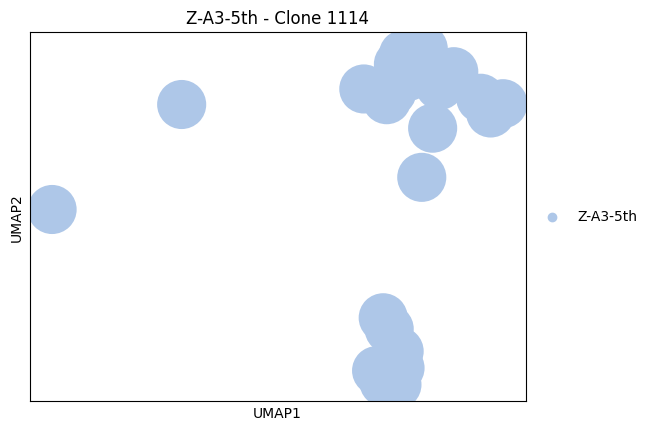

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


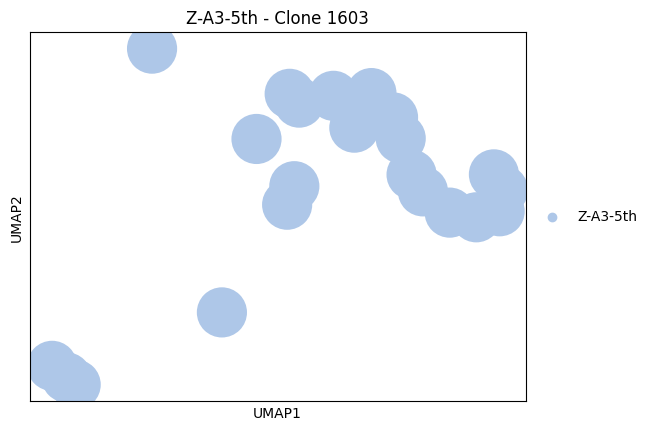

In [71]:
# 080623 Task 2


# Define Thaw/clonotype combinations
combinations = [
    ("M-A3-Uns", "19"), ("M-A3-3rd", "19"), ("M-A3-6th", "19"), ("M-A3-9th", "19"),
    ("M-A3-6th", "14"), ("M-A3-9th", "14"),
    ("M-A3-3rd", "66"), ("M-A3-6th", "66"), ("M-A3-9th", "66"),
    ("M-A3-6th", "697"), ("M-A3-9th", "697"),
    ("M-A3-3rd", "43"), ("M-A3-6th", "43"),
    ("M-A3-3rd", "222"), ("M-A3-6th", "222"),
    ("U-A3-7th", "47"), ("U-A3-10th", "47"),
    ("U-A3-7th", "306"), ("U-A3-10th", "306"),
    ("U-A3-7th", "81"), ("U-A3-10th", "81"),
    ("U-A3-4th", "39"), ("U-A3-7th", "39"), ("U-A3-10th", "39"),
    ("U-A3-4th", "89"), ("U-A3-7th", "89"), ("U-A3-10th", "89"),
    ("U-A3-7th", "190"),
    ("Z-A3-5th", "536"), ("Z-A3-9th", "536"),
    ("Z-A3-5th", "530"), ("Z-A3-5th", "1114"), ("Z-A3-5th", "1603")
]

# Loop through each Thaw/clonotype combination and generate UMAPs
for thaw, clone in combinations:
    # Extract the indices from mdata["airr"] where the Thaw and clone_id match the current combination
    selected_indices = mdata["airr"].obs[(mdata["airr"].obs['Thaw'] == thaw) & (mdata["airr"].obs['clone_id'] == clone)].index
    
    # Use these indices to filter mdata["gex"]
    filtered_data = mdata["gex"][mdata["gex"].obs.index.isin(selected_indices)]
    
    # Check if there's data after filtering
    if filtered_data.shape[0] > 0:
        # Generate the UMAP
        sc.tl.umap(filtered_data)
        
        # Plot the UMAP with the title as the Thaw name and clonotype
        sc.pl.umap(filtered_data, color='Thaw', title=f"{thaw} - Clone {clone}")
    else:
        print(f"No data for Thaw {thaw} in clonotype {clone}.")



In [72]:
columns_in_gex_obs = mdata["gex"].obs.columns
print(columns_in_gex_obs)


Index(['TotalSeq-C0251 anti-human Hashtag 1 Antibody',
       'TotalSeq-C0252 anti-human Hashtag 2 Antibody',
       'TotalSeq-C0253 anti-human Hashtag 3 Antibody',
       'TotalSeq-C0254 anti-human Hashtag 4 Antibody',
       'TotalSeq-C0255 anti-human Hashtag 5 Antibody',
       'TotalSeq-C0256 anti-human Hashtag 6 Antibody',
       'TotalSeq-C0257 anti-human Hashtag 7 Antibody',
       'TotalSeq-C0258 anti-human Hashtag 8 Antibody',
       'TotalSeq-C0259 anti-human Hashtag 9 Antibody',
       'TotalSeq-C0260 anti-human Hashtag 10 Antibody',
       'TotalSeq-C0262 anti-human Hashtag 12 Antibody',
       'TotalSeq-C0263 anti-human Hashtag 13 Antibody',
       'most_likely_hypothesis', 'cluster_feature',
       'negative_hypothesis_probability', 'singlet_hypothesis_probability',
       'doublet_hypothesis_probability', 'Classification', 'Thaw', 'batch',
       'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt',
       'total_counts_ribo', 'pct_counts_ribo', 'total

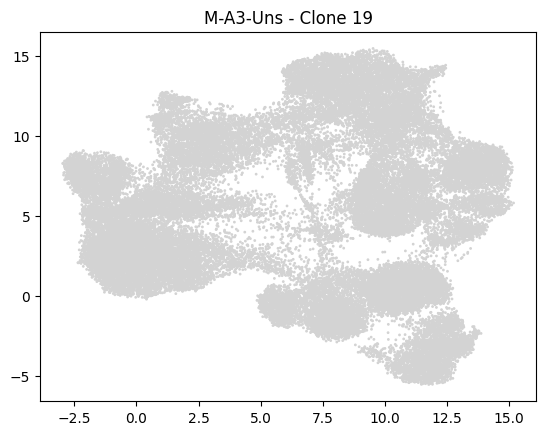

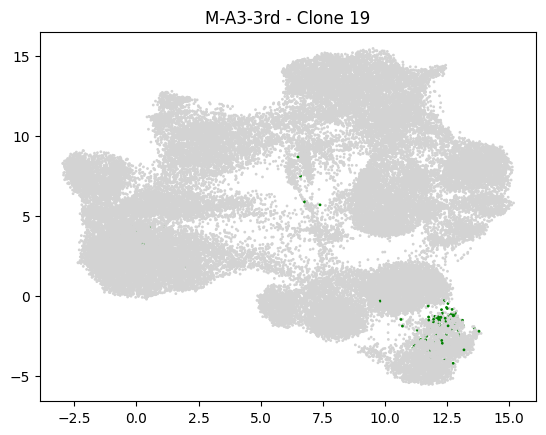

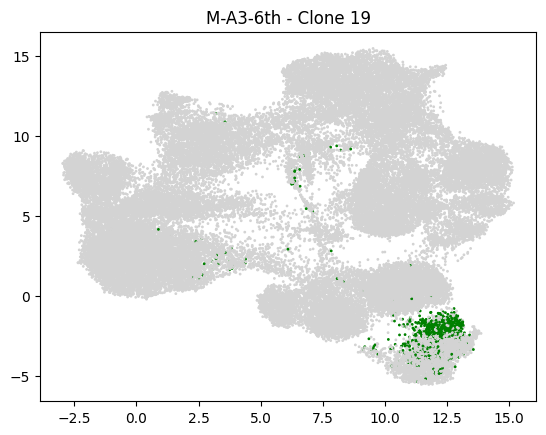

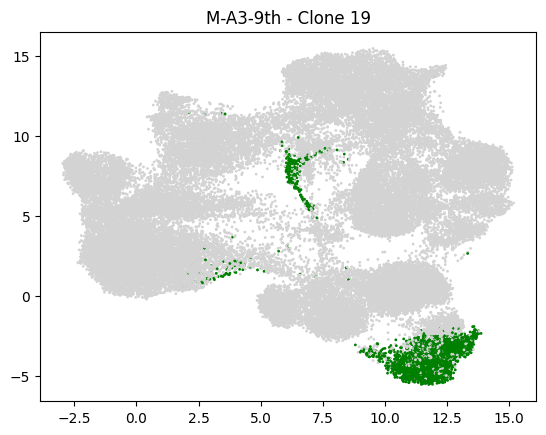

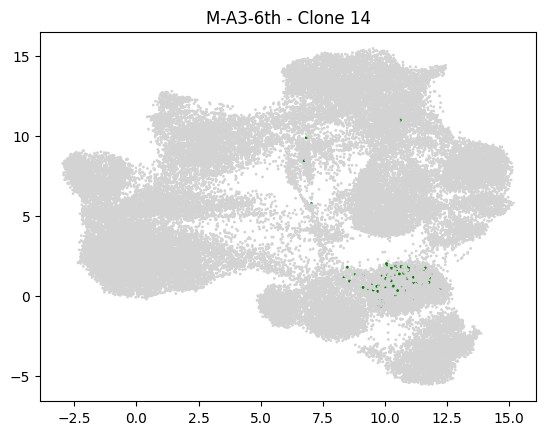

...

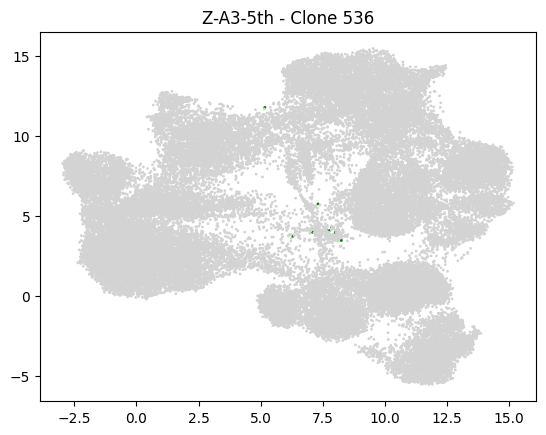

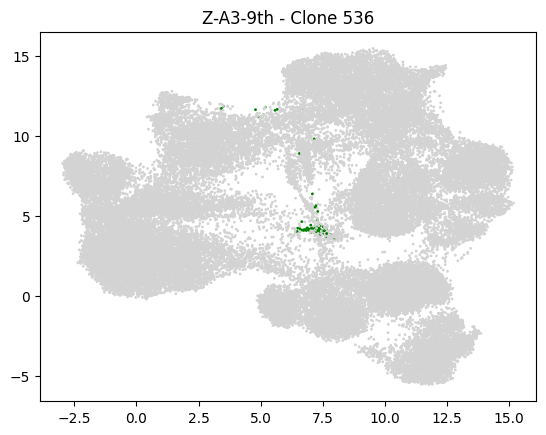

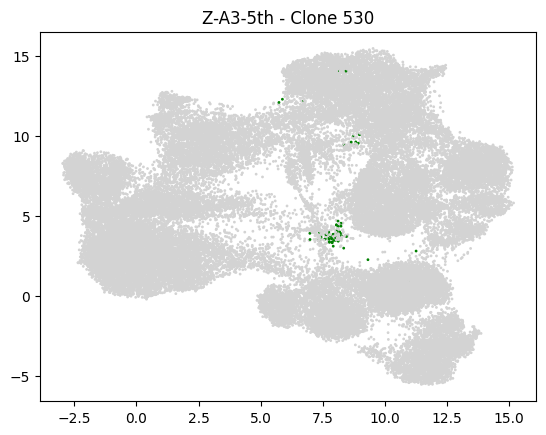

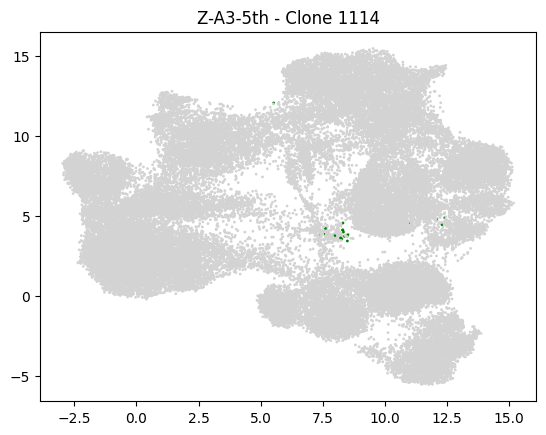

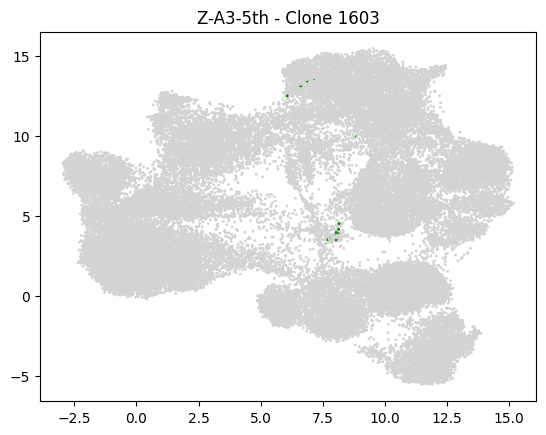

In [76]:
# First, compute UMAP for all cells
sc.tl.umap(mdata["gex"])

# Loop through each Thaw/clonotype combination
for thaw, clone in combinations:
    # Create a new color column and set default value as 'grey'
    mdata["gex"].obs['color'] = 'lightgrey'
    
    # Get the indices from mdata["airr"] where the Thaw and clone_id match the current combination
    selected_indices = mdata["airr"].obs[(mdata["airr"].obs['Thaw'] == thaw) & (mdata["airr"].obs['clone_id'] == clone)].index
    
    # Update color for cells of interest to 'green'
    mask = mdata["gex"].obs.index.isin(selected_indices)
    mdata["gex"].obs.loc[mask, 'color'] = 'green'
    
    # Use matplotlib to plot
    fig, ax = plt.subplots()  # Fixed the syntax error here by removing the word 'clone'
    umap_coordinates = mdata["gex"].obsm['X_umap']
    ax.scatter(umap_coordinates[:, 0], umap_coordinates[:, 1], c=mdata["gex"].obs['color'], s=1)
    plt.title(f"{thaw} - Clone {clone}")
    plt.show()


In [79]:
columns_in_airr = mdata["airr"].obs.columns
print(columns_in_airr)


Index(['high_confidence', 'is_cell', 'batch', 'receptor_type',
       'receptor_subtype', 'chain_pairing', 'clone_id', 'clone_id_size',
       'Thaw', 'derived_donor', 'predominant_thaw'],
      dtype='object')


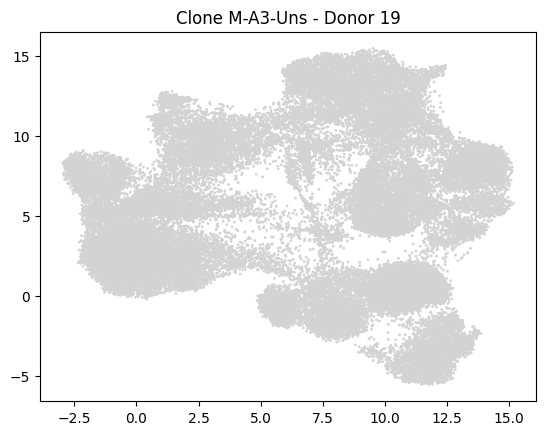

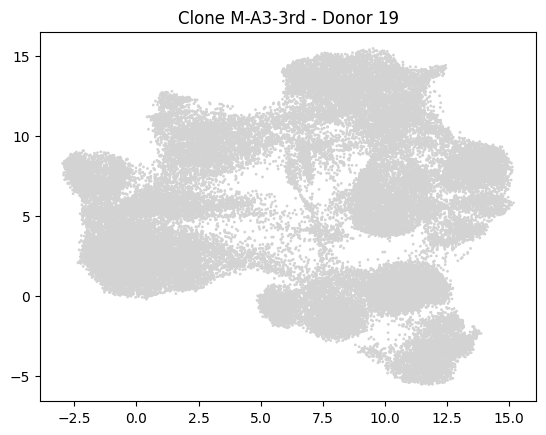

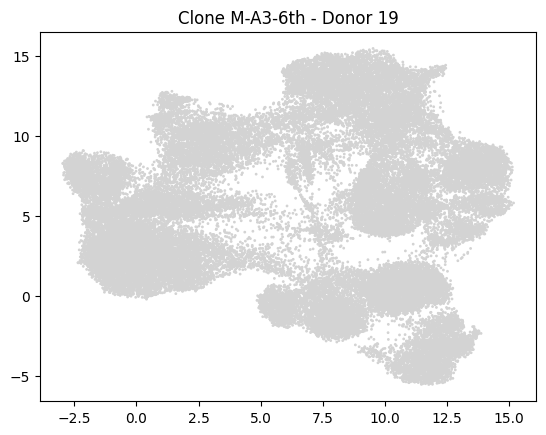

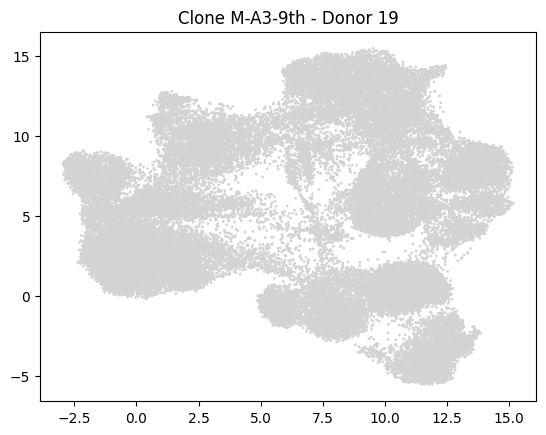

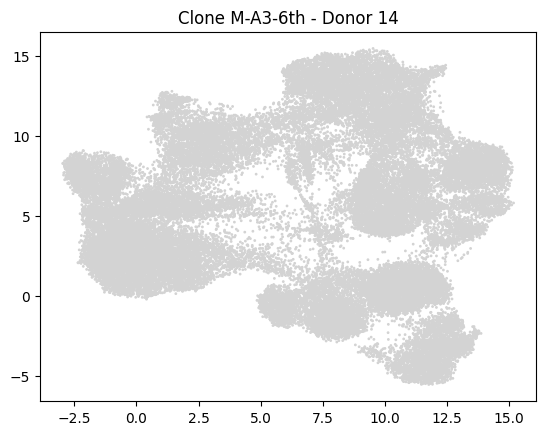

...

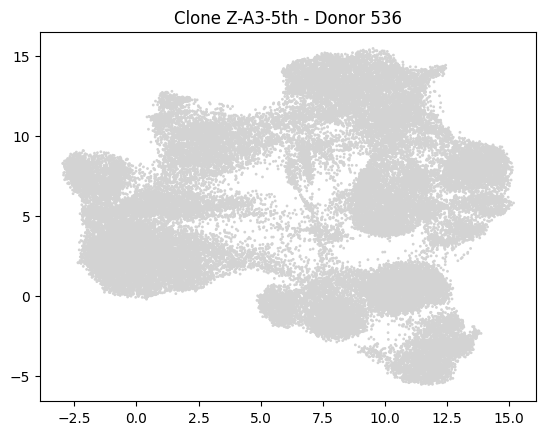

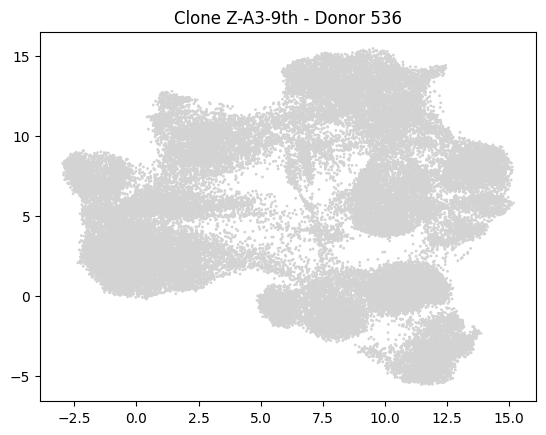

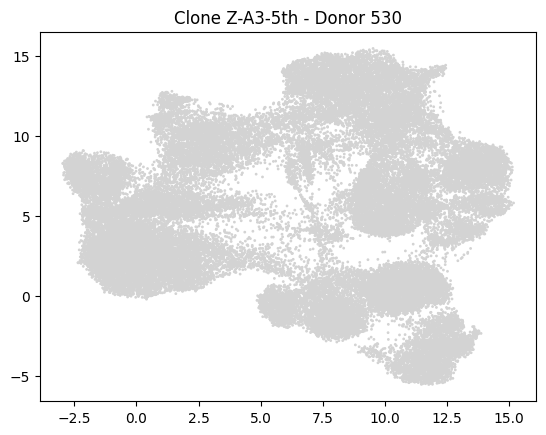

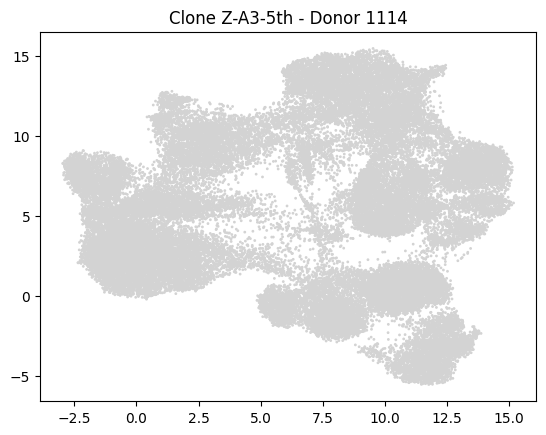

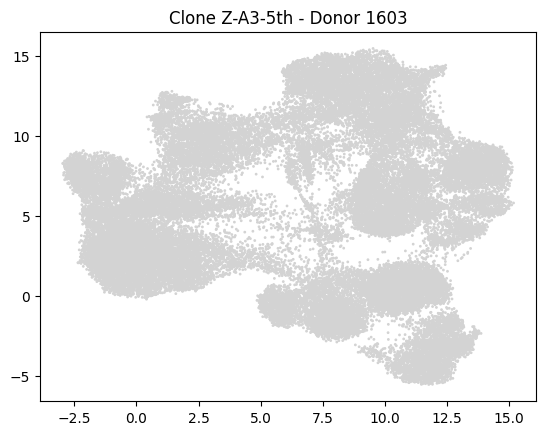

In [80]:
# First, compute UMAP for all cells using GEX data
sc.tl.umap(mdata["gex"])

# Loop through each clone-donor combination
for clone, donor in combinations:
    # Create a new color column and set default value as 'lightgrey'
    mdata["gex"].obs['color'] = 'lightgrey'
    
    # Extract the indices from mdata["airr"] where 'clone_id' and 'derived_donor' match the current combination
    selected_indices = mdata["airr"].obs[(mdata["airr"].obs['clone_id'] == clone) & (mdata["airr"].obs['derived_donor'] == donor)].index
    
    # Update color for cells of interest in mdata["gex"] to 'green'
    mask = mdata["gex"].obs.index.isin(selected_indices)
    mdata["gex"].obs.loc[mask, 'color'] = 'green'
    
    # Use matplotlib to plot
    fig, ax = plt.subplots()
    umap_coordinates = mdata["gex"].obsm['X_umap']
    ax.scatter(umap_coordinates[:, 0], umap_coordinates[:, 1], c=mdata["gex"].obs['color'], s=1)
    plt.title(f"Clone {clone} - Donor {donor}")
    plt.show()


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


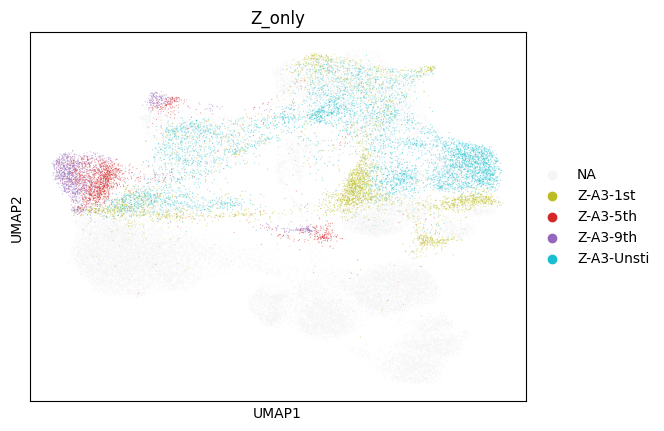

In [81]:
# keep all GEX, but restrict label set to each donor
thaw_to_donor = {
    'Z-A3-Unsti' : "Z-A3-Unsti",
    'Z-A3-1st' : "Z-A3-1st", 
    'Z-A3-5th' : "Z-A3-5th",  
    'Z-A3-9th' : "Z-A3-9th",    
    "M-A3-Unsti" : "NA",  
    "M-A3-3rd" : "NA",
    "M-A3-6th": "NA",
    "M-A3-9th" : "NA",
    "U-A3-Unsti" : "NA",
    "U-A3-4th" : "NA",
    "U-A3-7th": "NA",
    "U-A3-10th": "NA"
}

mdata["gex"].obs["Z_only"] = mdata["gex"].obs['Thaw'].map(thaw_to_donor)
sc.tl.umap(mdata["gex"])
sc.pl.umap(mdata["gex"], color='Z_only', alpha=0.5, palette={'Z-A3-Unsti':'tab:cyan',
                                                      'Z-A3-1st':'tab:olive',
                                                      'Z-A3-5th':'tab:red',
                                                      "Z-A3-9th":"tab:purple",      
                                                      'NA':'whitesmoke'})

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


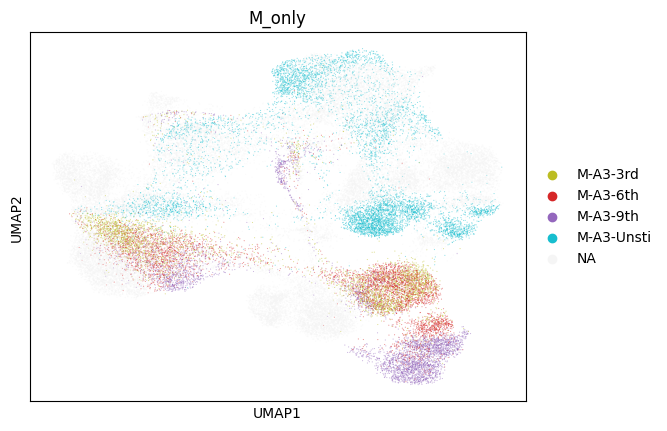

In [82]:
thaw_to_donor = {
    'Z-A3-Unsti' : "NA",
    'Z-A3-1st' : "NA", 
    'Z-A3-5th' : "NA",  
    'Z-A3-9th' : "NA",    
    "M-A3-Unsti" : "M-A3-Unsti",  
    "M-A3-3rd" : "M-A3-3rd",
    "M-A3-6th": "M-A3-6th",
    "M-A3-9th" : "M-A3-9th",
    "U-A3-Unsti" : "NA",
    "U-A3-4th" : "NA",
    "U-A3-7th": "NA",
    "U-A3-10th": "NA"
}
mdata["gex"].obs["M_only"] = mdata["gex"].obs['Thaw'].map(thaw_to_donor)
sc.tl.umap(mdata["gex"])
sc.pl.umap(mdata["gex"], color='M_only', alpha=0.5, palette={'M-A3-Unsti':'tab:cyan',
                                                      'M-A3-3rd':'tab:olive',
                                                      "M-A3-6th":'tab:red',   
                                                      'M-A3-9th':'tab:purple',
                                                      'NA':'whitesmoke'})

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


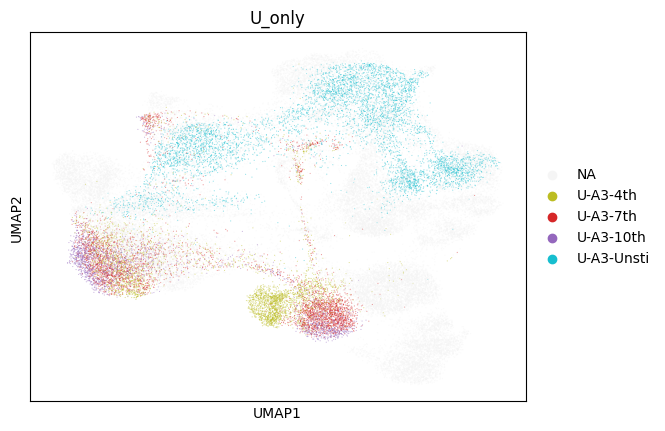

In [85]:
thaw_to_donor = {
    'Z-A3-Unsti' : "NA",
    'Z-A3-1st' : "NA", 
    'Z-A3-5th' : "NA",  
    'Z-A3-9th' : "NA",    
    "M-A3-Unsti" : "NA",  
    "M-A3-3rd" : "NA",
    "M-A3-6th": "NA",
    "M-A3-9th" : "NA",
    "U-A3-Unsti" : "U-A3-Unsti",
    "U-A3-4th" : "U-A3-4th",
    "U-A3-7th": "U-A3-7th",
    "U-A3-10th": "U-A3-10th"
}
mdata["gex"].obs["U_only"] = mdata["gex"].obs['Thaw'].map(thaw_to_donor)
sc.tl.umap(mdata["gex"])
sc.pl.umap(mdata["gex"], color='U_only', alpha=0.5, palette={'U-A3-Unsti':'tab:cyan',
                                                      'U-A3-4th':'tab:olive',
                                                      'U-A3-7th':'tab:red',
                                                      'U-A3-10th':'tab:purple',
                                                      'NA':'whitesmoke'})

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


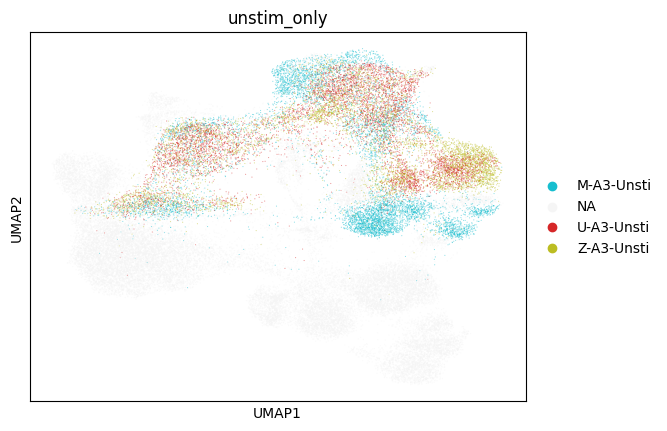

In [86]:
# keep all GEX, but restrict label set to each unstim
thaw_to_donor = {
    'Z-A3-Unsti' : "Z-A3-Unsti",
    'Z-A3-1st' : "NA", 
    'Z-A3-5th' : "NA",  
    'Z-A3-9th' : "NA",    
    "M-A3-Unsti" : "M-A3-Unsti",  
    "M-A3-3rd" : "NA",
    "M-A3-6th": "NA",
    "M-A3-9th" : "NA",
    "U-A3-Unsti" : "U-A3-Unsti",
    "U-A3-4th" : "NA",
    "U-A3-7th": "NA",
    "U-A3-10th": "NA"
}

mdata["gex"].obs["unstim_only"] = mdata["gex"].obs['Thaw'].map(thaw_to_donor)
sc.tl.umap(mdata["gex"])
sc.pl.umap(mdata["gex"], color='unstim_only', alpha=0.5, palette={'M-A3-Unsti':'tab:cyan',
                                                      'Z-A3-Unsti':'tab:olive',
                                                      'U-A3-Unsti':'tab:red',
                                                      'NA':'whitesmoke'})

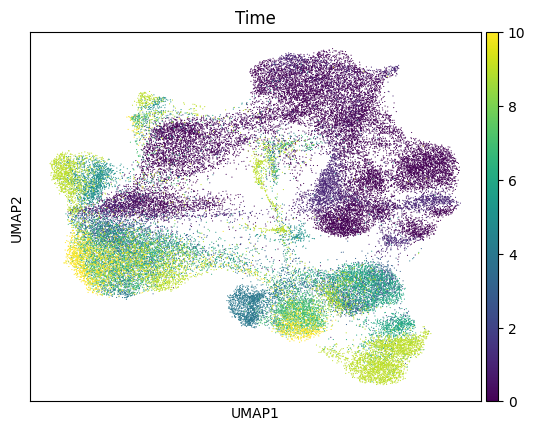

In [87]:
# task 3
# 3 UMAPs (one for each donor), non-TCR-repertoire RNA, color by different time points
# create a new column called Sample that applies the predefined sample map
thaw_to_time = {
    
    'Z-A3-Unsti' : 0,
    'Z-A3-1st' : 1, 
    'Z-A3-5th' : 5,  
    'Z-A3-9th' : 9,    
    "M-A3-Unsti" : 0,  
    "M-A3-3rd" : 3,
    "M-A3-6th": 6,
    "M-A3-9th" : 9,
    "U-A3-Unsti" : 0,
    "U-A3-4th" : 4,
    "U-A3-7th": 7,
    "U-A3-10th": 10
}
mdata["gex"].obs["Time"] = mdata["gex"].obs['Thaw'].map(thaw_to_time)
sc.tl.umap(mdata["gex"])
sc.pl.umap(mdata["gex"], color='Time' )#, save="UMAP.png")

In [101]:
from mudata import MuData

mdata = MuData({
    "gex": mdata["gex"],
    "airr": mdata["airr"],
    "prot": mdata["prot"]
})


mdata.update()
mdata["airr"] 

AnnData object with n_obs × n_vars = 40077 × 0
    obs: 'high_confidence', 'is_cell', 'batch', 'receptor_type', 'receptor_subtype', 'chain_pairing', 'clone_id', 'clone_id_size', 'Thaw', 'derived_donor', 'predominant_thaw'
    uns: 'chain_indices', 'ir_dist_nt_identity', 'clone_id', 'clonotype_network', 'predominant_thaw_colors'
    obsm: 'airr', 'chain_indices', 'X_clonotype_network'

In [96]:
mdata["airr"].obs.batch.index.intersection(mdata["airr"].obs.Thaw.index)

Index(['AAACCTGAGACTAAGT-1', 'AAACCTGAGCAATCTC-1', 'AAACCTGAGCCCAGCT-1',
       'AAACCTGAGCTCCTCT-1', 'AAACCTGAGGACGAAA-1', 'AAACCTGAGGGTGTTG-1',
       'AAACCTGAGGTGTGGT-1', 'AAACCTGAGTCGCCGT-1', 'AAACCTGAGTGAACAT-1',
       'AAACCTGAGTTAAGTG-1',
       ...
       'TTTGTCACATGCTAGT-1', 'TTTGTCACATTAGGCT-1', 'TTTGTCACATTGGGCC-1',
       'TTTGTCAGTCCAAGTT-1', 'TTTGTCAGTCCCTTGT-1', 'TTTGTCAGTGAAAGAG-1',
       'TTTGTCAGTGAAGGCT-1', 'TTTGTCATCACGATGT-1', 'TTTGTCATCCACTGGG-1',
       'TTTGTCATCTTGGGTA-1-1'],
      dtype='object', name='cell_id', length=40077)

In [102]:
print(mdata["prot"].obs.columns)


Index(['batch', 'percent_mito', 'n_counts', 'n_features', 'louvain',
       'num_isotype_flags',
       'TotalSeq-C0251 anti-human Hashtag 1 Antibody_binding',
       'TotalSeq-C0252 anti-human Hashtag 2 Antibody_binding',
       'TotalSeq-C0253 anti-human Hashtag 3 Antibody_binding',
       'TotalSeq-C0254 anti-human Hashtag 4 Antibody_binding',
       'TotalSeq-C0255 anti-human Hashtag 5 Antibody_binding',
       'TotalSeq-C0256 anti-human Hashtag 6 Antibody_binding',
       'TotalSeq-C0257 anti-human Hashtag 7 Antibody_binding',
       'TotalSeq-C0258 anti-human Hashtag 8 Antibody_binding',
       'TotalSeq-C0259 anti-human Hashtag 9 Antibody_binding',
       'TotalSeq-C0260 anti-human Hashtag 10 Antibody_binding',
       'TotalSeq-C0262 anti-human Hashtag 12 Antibody_binding',
       'TotalSeq-C0263 anti-human Hashtag 13 Antibody_binding',
       'TotalSeq-C0251 anti-human Hashtag 1 Antibody_specificity',
       'TotalSeq-C0252 anti-human Hashtag 2 Antibody_specificity',
       'To

In [98]:
# Convert 'Thaw' column to Categorical type and add 'N/A' as a category
mdata["airr"].obs["Thaw"] = mdata["airr"].obs["Thaw"].astype('category').cat.add_categories(['N/A'])

# Convert 'Thaw' column back to string type
mdata["airr"].obs["Thaw"] = mdata["airr"].obs["Thaw"].astype(str)

# Create DataFrames from the respective columns
first_df = pd.DataFrame(mdata["gex"].obs["Thaw"], dtype=object)
second_df = pd.DataFrame(mdata["airr"].obs.clonal_expansion)

# Perform a left join to align the indices and fill missing values with 'N/A'
aligned_df = first_df.join(second_df, how='right').fillna('N/A')

# Update the 'Thaw' column in the mdata["airr"] AnnData object
mdata["airr"].obs["Thaw"] = aligned_df['Thaw']

# Return the updated 'Thaw' column for verification
mdata["airr"].obs["Thaw"].head()  # Displaying the first few rows for verification


AttributeError: 'DataFrame' object has no attribute 'clonal_expansion'

In [99]:
# remove all barcodes 
#mdata["airr"].obs["Thaw"] =  #.obs.Thaw

# Create a DataFrame from the first column
first_df = pd.DataFrame(mdata["gex"].obs["Thaw"], dtype=object) #mdata["gex"].obs["Thaw"]

# Create a DataFrame from the second column
second_df = pd.DataFrame(mdata["airr"].obs.clonal_expansion ) # mdata["airr"].obs.clonal_expansion

# Perform a left join to align the indices and fill missing values with 'N/A'
aligned_df = first_df.join(second_df, how='right').fillna('N/A')
print(aligned_df)

# Update the 'second_column' in the AnnData object
mdata["airr"].obs["Thaw"] = aligned_df['Thaw']

# 
#mdata["airr"].obs.Thaw, mdata["airr"].obs.clonal_expansion
# Perform a left join to align the indices and fill missing values with 'N/A'
# mdata["airr"].obs["Thaw"] = mdata["gex"].obs["Thaw"].join(mdata["airr"].obs.clonal_expansion,
#                                                           how='left', rsuffix='_second').fillna('N/A')

# Update the 'second_column' in the AnnData object
#adata.obs['second_column'] = aligned_df['second_column_second']
mdata["airr"].obs["Thaw"]

AttributeError: 'DataFrame' object has no attribute 'clonal_expansion'

In [ ]:
mdata["airr"].obs["Thaw"]

In [ ]:
mdata["airr"][mdata["airr"].obs["Thaw"] == thaw_name]

In [ ]:
# Define a color map that includes lightgrey for the default_color_value
cmap_custom = plt.cm.viridis
cmap_custom.set_under('lightgrey')

# Get unique Thaw values
unique_thaws = mdata["gex"].obs.Thaw.unique()

# Set the default color value to the minimum clone_id_size minus a small offset (e.g., 0.1)
default_color_value = mdata["airr"].obs['clone_id_size'].min() - 0.1

for thaw in unique_thaws:
    # Create a new color column and set default value
    mdata["gex"].obs['color'] = default_color_value
    
    # Get the indices from mdata["airr"] where the Thaw matches the current Thaw
    selected_indices_airr = mdata["airr"].obs[mdata["airr"].obs['Thaw'] == thaw].index
    
    # Get common indices between mdata["gex"] and the selected indices from mdata["airr"]
    common_indices = mdata["gex"].obs.index.intersection(selected_indices_airr)
    
    # Update the color based on clone_id_size for cells of interest
    mask = mdata["gex"].obs.index.isin(common_indices)
    mdata["gex"].obs.loc[mask, 'color'] = mdata["airr"].obs.loc[common_indices, 'clone_id_size']
    
    # Use matplotlib to plot
    fig, ax = plt.subplots()
    umap_coordinates = mdata["gex"].obsm['X_umap']
    scatter = ax.scatter(umap_coordinates[:, 0], umap_coordinates[:, 1], c=mdata["gex"].obs['color'], s=1, cmap=cmap_custom, vmin=default_color_value + 0.01)
    plt.colorbar(scatter, ax=ax)
    plt.title(f"{thaw} - Clone ID Size")
    plt.show()


In [ ]:
# Count the number of cells in protein and TCR datasets
num_cells_protein = mdata["prot"].shape[0]
num_cells_tcr = mdata["airr"].shape[0]

print(f"Number of cells in protein data: {num_cells_protein}")
print(f"Number of cells in TCR data: {num_cells_tcr}")


In [ ]:
import os
os.getcwd()


In [40]:
# clonal expansion -- do all this for each sample (do one for all samples, then do by donor)
for thaw_name in mdata["gex"].obs.Thaw.unique():
    # so now we want to apply the thaw labels to the airr and subset on that
    
    mdata_subset = mu.MuData({"gex": mdata["gex"][mdata["gex"].obs.Thaw == thaw_name],  
                   "airr": mdata["airr"][mdata["airr"].obs["Thaw"] == thaw_name],
                   "prot": mdata["prot"][mdata["prot"].obs.Thaw == thaw_name]})
    
    
    #print(mdata_subset["airr"])
    # using default parameters, `ir_dist` will compute nucleotide sequence identity
    # compute the  clonotypes on the subset but plot the rest                         
    ir.pp.ir_dist(mdata_subset)
    ir.tl.define_clonotypes(mdata_subset, receptor_arms="all", dual_ir="primary_only")
    #ir.tl.clonotype_network(mdata_subset, min_cells=30)
    ir.tl.clonal_expansion(mdata_subset)
    #print(mdata_subset["airr"].obs)#["clonal_expansion"])
    ce_name = thaw_name +"_clonal_expansion"
    ci_name = thaw_name + "_clone_id_size"
    mdata["airr"].obs[ce_name] = mdata_subset["airr"].obs["clonal_expansion"]
    mdata["airr"].obs[ci_name] = mdata_subset["airr"].obs["clone_id_size"]
#     temp_mdata = mu.MuData({"gex": file_list[0],  
#                    "airr": file_list[1],
#                    "prot": file_list[2]})
    mdata.update() # this shouldn't do anything
    print(thaw_name)
    mu.pl.embedding(
        mdata, basis="gex:umap", color=["airr:"+ce_name, "airr:"+ci_name]
    )
    # need to have the rna data umap computed
    # again change the groupby to use your sample labels
    #ir.pl.clonal_expansion( # groupby="gex:cluster"
    #    mdata_subset, target_col="clone_id" , clip_at=10, normalize=False, groupby="gex:Sample"
    #)
    #ir.pl.clonal_expansion(mdata_subset, target_col="clone_id", clip_at=10, groupby="gex:Sample")

AttributeError: 'DataFrame' object has no attribute 'Thaw'

In [ ]:
# clonal expansion -- do all this for each sample (do one for all samples, then do by donor)
ir.tl.clonal_expansion(mdata)
mu.pl.embedding(
    mdata, basis="gex:umap", color=["airr:clonal_expansion", "airr:clone_id_size"]
)
# need to have the rna data umap computed
# again change the groupby to use your sample labels
ir.pl.clonal_expansion( # groupby="gex:cluster"
    mdata, target_col="clone_id" , clip_at=10, normalize=False, groupby="gex:Time"
)
ir.pl.clonal_expansion(mdata, target_col="clone_id", clip_at=10, groupby="gex:Time")

In [ ]:
# now let's examine the tcr data more
mdata["airr"].obs.receptor_type

In [ ]:
mdata["airr"].obs.receptor_subtype

In [ ]:
mdata["airr"].obs.chain_pairing

In [ ]:
# Get the indices of rows with "nan" values in mdata["gex"].obs
nan_gex_indices = mdata["gex"].obs.index[mdata["gex"].obs['Thaw'].isna()]

# Extract the corresponding rows from mdata["airr"].obs using these indices
nan_airr_data = mdata["airr"].obs.loc[nan_gex_indices]

# Group by clone_id and Thaw to get the count of cells
grouped_counts = nan_airr_data.groupby(['clone_id', 'Thaw']).size().reset_index(name='count')

# Convert the grouped data to a pivot table for better visualization
pivot_table = pd.pivot_table(grouped_counts, values='count', index=['clone_id'], columns=['Thaw'], fill_value=0)

print(pivot_table)


In [ ]:
# Get common indices between mdata["gex"].obs and mdata["airr"].obs
common_indices = mdata["gex"].obs.index.intersection(mdata["airr"].obs.index)

# Extract the 'clone_id' from mdata["airr"] for only the common indices
mdata["gex"].obs.loc[common_indices, "clone_id"] = mdata["airr"].obs.loc[common_indices, "clone_id"]

# Step 1: Identify Clones Labeled as NaN
# Filter the GEX data for cells where the clonotype is NaN
nan_clones_gex = mdata["gex"][mdata["gex"].obs['clone_id'].isna()]

# Step 2: Analyze GEX Data
# Group by the thaw and count the number of cells for each NaN clone
clone_counts_by_thaw_gex = nan_clones_gex.obs.groupby('Thaw').size()

# Step 3: Display Number of Cells for Different Thaws
print(clone_counts_by_thaw_gex)


In [ ]:
# Group the nan_clones_gex by Thaw and count the number of cells
nan_clone_counts = nan_clones_gex.obs.groupby('Thaw').size()

# Plot a bar chart using the counts
nan_clone_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Number of NaN Clonotype Cells Across Thaw Samples')
plt.ylabel('Number of Cells')
plt.xlabel('Thaw Sample')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


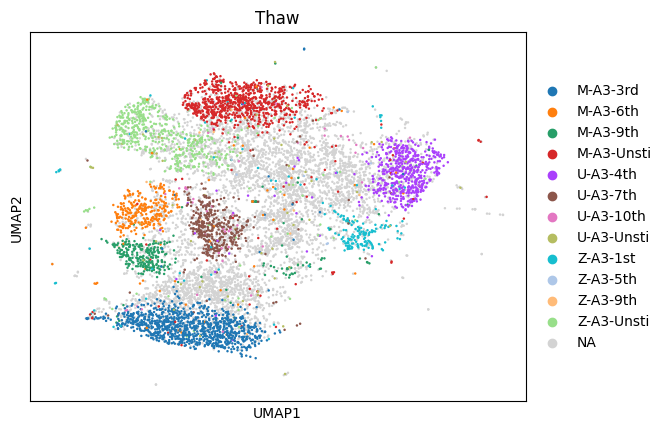

In [103]:
# Compute UMAP for the protein modality
sc.tl.umap(mdata["prot"])

# Plot the UMAP for the protein modality and color by 'Thaw'
sc.pl.umap(mdata["prot"], color = 'Thaw')


In [118]:
print(mdata["airr"].obs["Thaw"].value_counts())


nan           14649
M-A3-Unsti     4876
Z-A3-Unsti     3564
U-A3-Unsti     3323
M-A3-9th       2935
Z-A3-1st       2518
M-A3-6th       2151
U-A3-4th       1843
U-A3-7th       1637
M-A3-3rd       1619
U-A3-10th       621
Z-A3-5th        210
Z-A3-9th        131
Name: Thaw, dtype: int64


In [119]:
m_clones = mdata["airr"].obs[mdata["airr"].obs['derived_donor'] == 'M'].copy()
print(m_clones.head())


                    high_confidence  is_cell  batch receptor_type  \
cell_id                                                             
AAACCTGAGACTAAGT-1             True     True  lib_0           TCR   
AAACCTGAGCAATCTC-1             True     True  lib_0           TCR   
AAACCTGAGGACGAAA-1             True     True  lib_0           TCR   
AAACCTGCACACGCTG-1             True     True  lib_0           TCR   
AAACCTGCACATGACT-1             True     True  lib_0           TCR   

                   receptor_subtype chain_pairing clone_id  clone_id_size  \
cell_id                                                                     
AAACCTGAGACTAAGT-1          TRA+TRB      extra VJ        0              1   
AAACCTGAGCAATCTC-1          TRA+TRB      extra VJ        1              5   
AAACCTGAGGACGAAA-1          TRA+TRB   single pair        4            530   
AAACCTGCACACGCTG-1          TRA+TRB   single pair       14            428   
AAACCTGCACATGACT-1          TRA+TRB     extra VDJ     

In [146]:
def determine_tier_and_rating(group):
    # If the group is empty, return -1 as the default bin
    if group.empty:
        return pd.Series({'bin': -1, 'rating': None})

    # Check the predominant thaw for the clone
    predominant_thaw = group['predominant_thaw'].iloc[0]
    
    # Initialize rating to None (we'll compute it only for bins 2, 3, 4, 6, 7, 8, 10, 11, and 12)
    rating = None
    
    # Mapping of thaws to bins
    thaw_to_bin = {
        'M-A3-Unsti': 1, 
        'M-A3-3rd': 2, 
        'M-A3-6th': 3, 
        'M-A3-9th': 4,
        'Z-A3-Unsti': 5, 
        'Z-A3-1st': 6, 
        'Z-A3-5th': 7, 
        'Z-A3-9th': 8,
        'U-A3-Unsti': 9, 
        'U-A3-4th': 10, 
        'U-A3-7th': 11, 
        'U-A3-10th': 12
    }
    
    bin_num = thaw_to_bin.get(predominant_thaw, -1)
    
    # Rating calculations
    if bin_num == 2:
        rating = group[group['Thaw'] == 'M-A3-3rd'].shape[0] / (group[group['Thaw'] == 'M-A3-Unsti'].shape[0] + 1)
    elif bin_num == 3:
        rating = group[group['Thaw'] == 'M-A3-6th'].shape[0] / (group[group['Thaw'] == 'M-A3-3rd'].shape[0] + 1)
    elif bin_num == 4:
        rating = group[group['Thaw'] == 'M-A3-9th'].shape[0] / (group[group['Thaw'] == 'M-A3-6th'].shape[0] + 1)
    elif bin_num == 6:
        rating = group[group['Thaw'] == 'Z-A3-1st'].shape[0] / (group[group['Thaw'] == 'Z-A3-Unsti'].shape[0] + 1)
    elif bin_num == 7:
        rating = group[group['Thaw'] == 'Z-A3-5th'].shape[0] / (group[group['Thaw'] == 'Z-A3-1st'].shape[0] + 1)
    elif bin_num == 8:
        rating = group[group['Thaw'] == 'Z-A3-9th'].shape[0] / (group[group['Thaw'] == 'Z-A3-5th'].shape[0] + 1)
    elif bin_num == 10:
        rating = group[group['Thaw'] == 'U-A3-4th'].shape[0] / (group[group['Thaw'] == 'U-A3-Unsti'].shape[0] + 1)
    elif bin_num == 11:
        rating = group[group['Thaw'] == 'U-A3-7th'].shape[0] / (group[group['Thaw'] == 'U-A3-4th'].shape[0] + 1)
    elif bin_num == 12:
        rating = group[group['Thaw'] == 'U-A3-10th'].shape[0] / (group[group['Thaw'] == 'U-A3-7th'].shape[0] + 1)
    
    return pd.Series({'bin': bin_num, 'rating': rating})



clone_sizes = mdata['airr'].obs.groupby('clone_id').size()

# Filter out clones with fewer than 10 cells
large_clones = mdata['airr'].obs[mdata['airr'].obs['clone_id'].isin(clone_sizes[clone_sizes > 10].index)]

# Group by clone_id and determine the bin and rating for each unique clone in the filtered data
clone_bins_ratings = large_clones.groupby('clone_id').apply(determine_tier_and_rating)

# Count the number of clones in each bin
bin_counts = clone_bins_ratings['bin'].value_counts().sort_index()

print(bin_counts)



-1.0     13224
 1.0        76
 2.0        36
 3.0        40
 4.0         4
 5.0         9
 6.0        73
 7.0         3
 8.0         1
 9.0        26
 10.0       16
 11.0       13
 12.0        3
Name: bin, dtype: int64


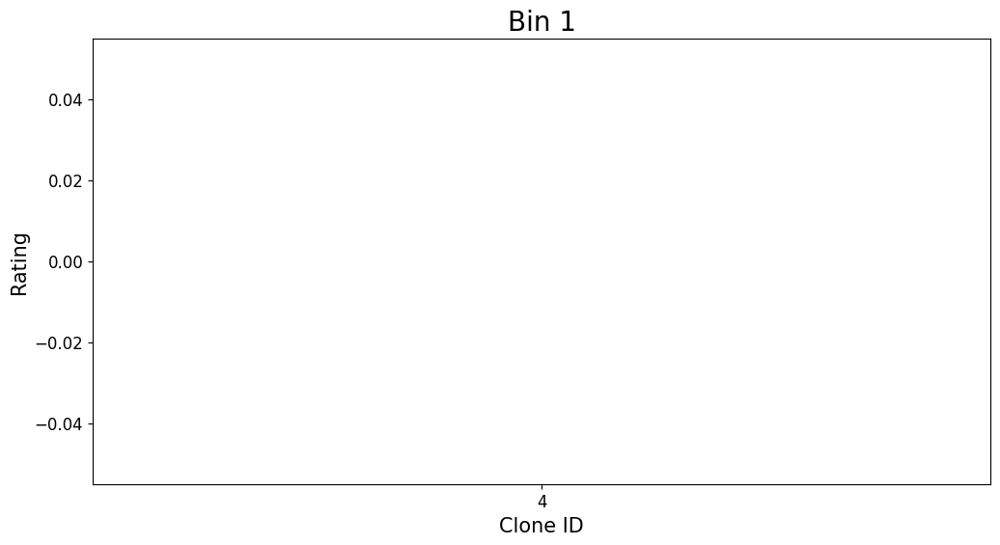

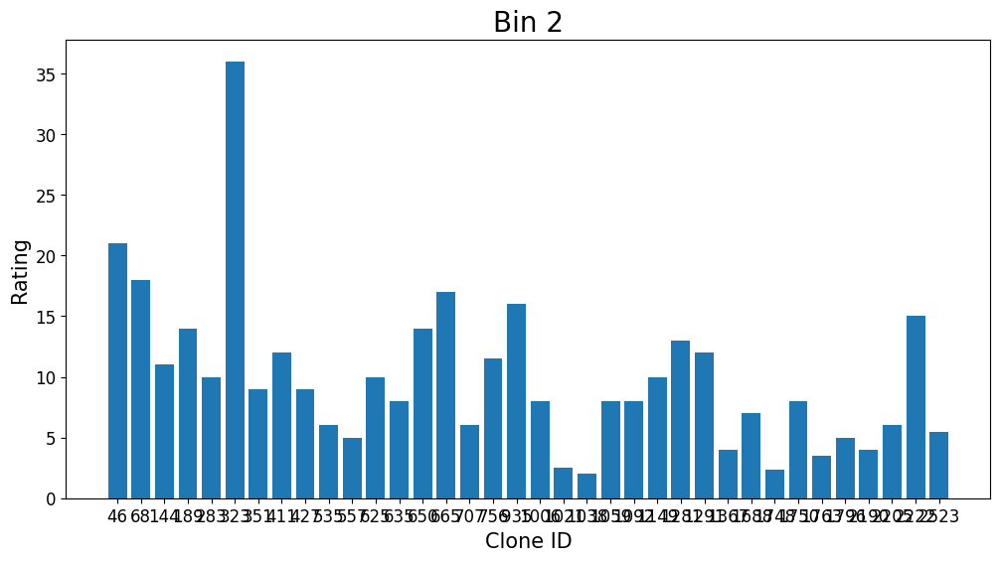

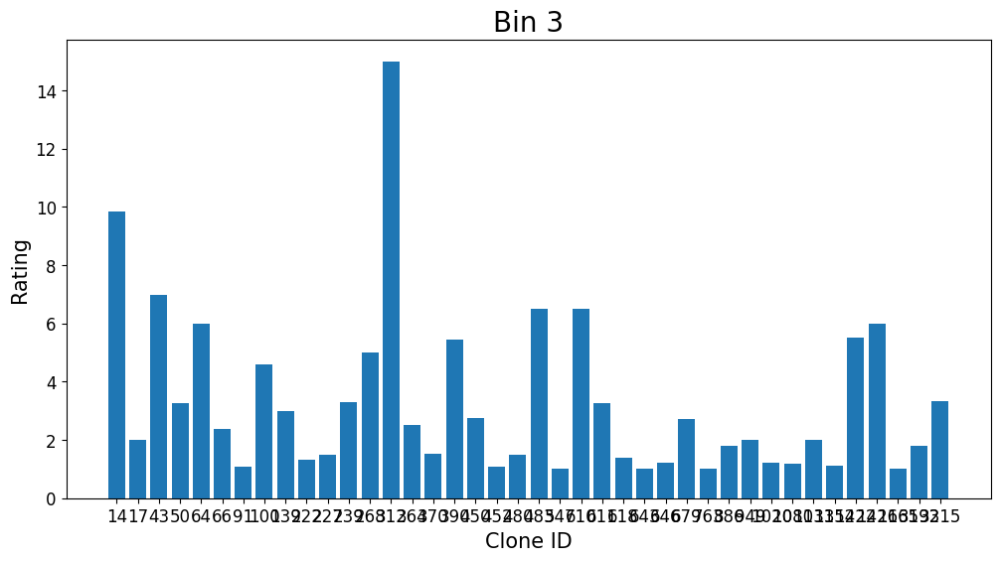

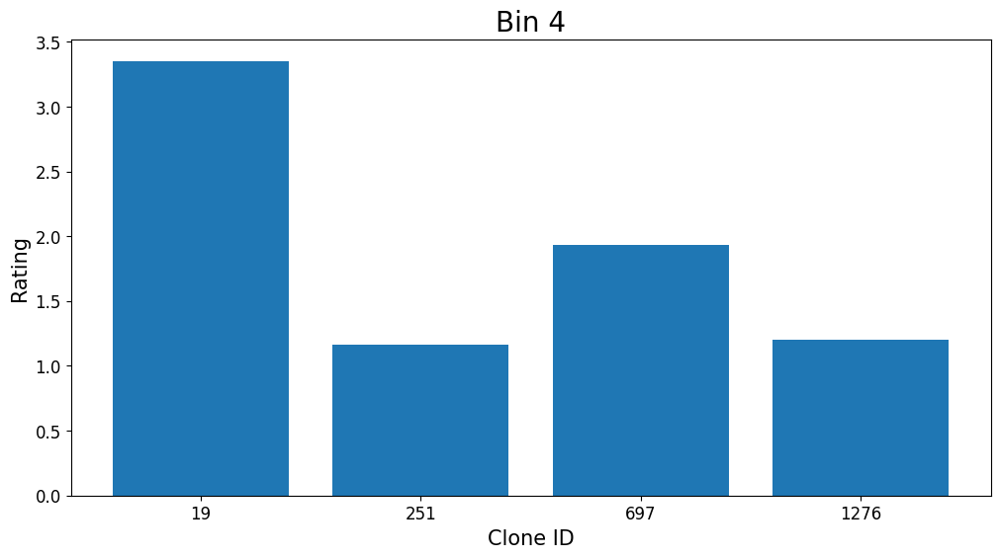

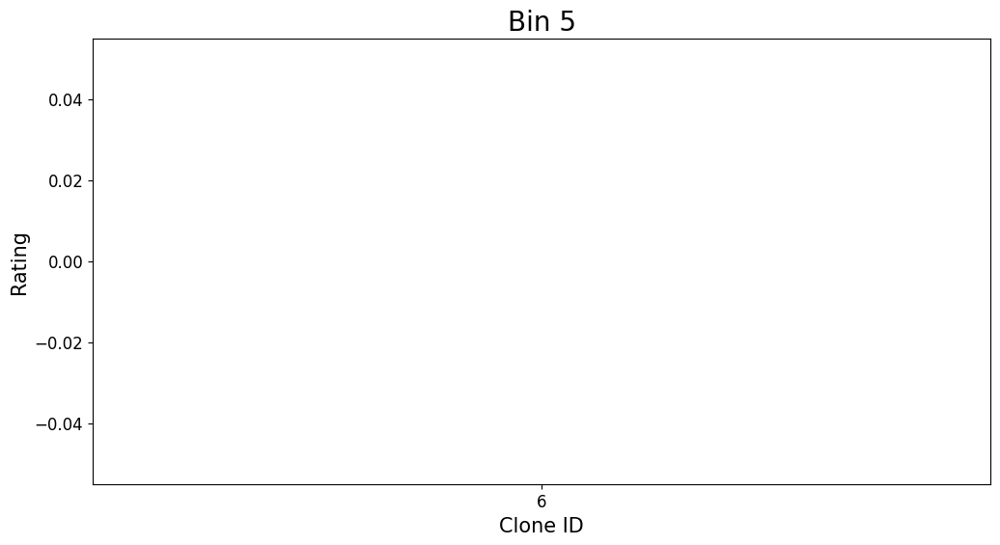

...

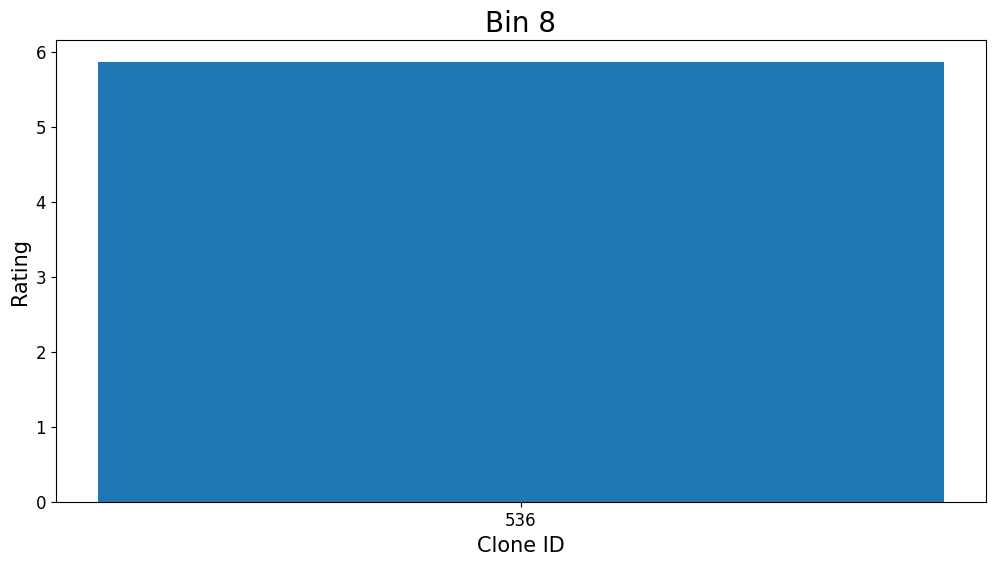

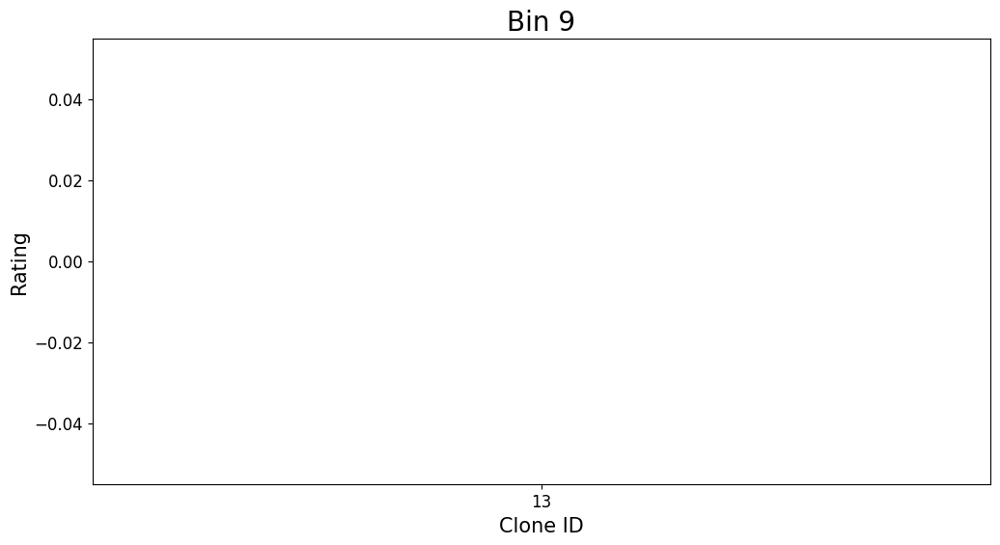

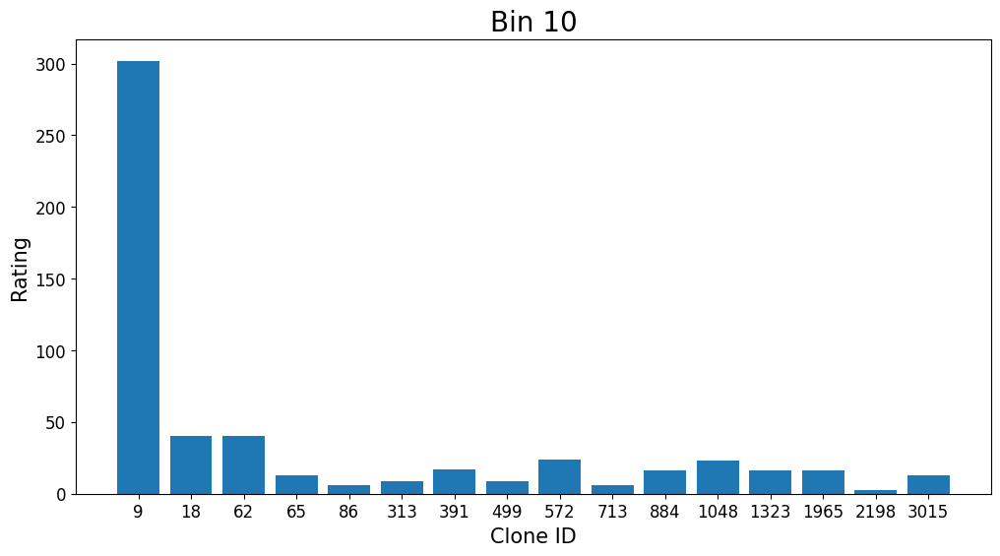

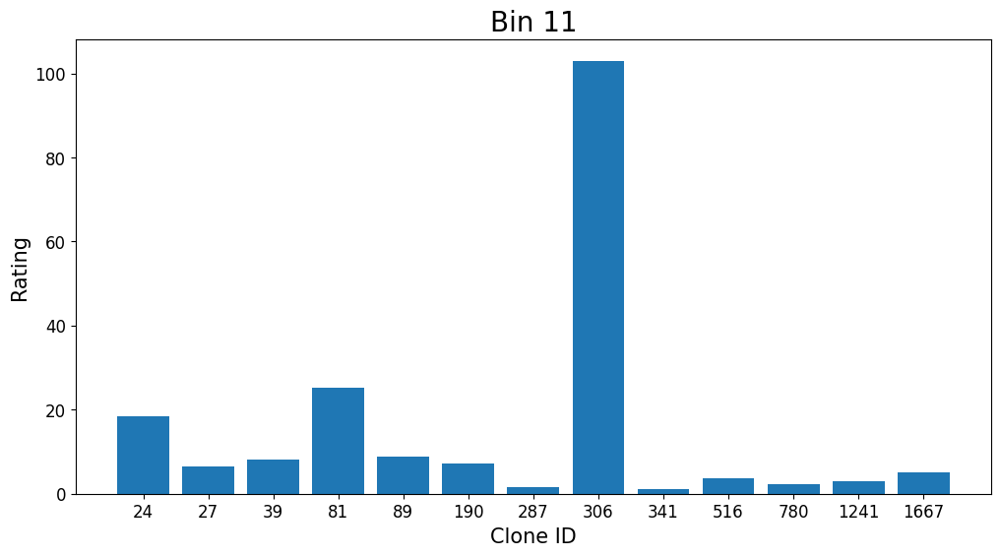

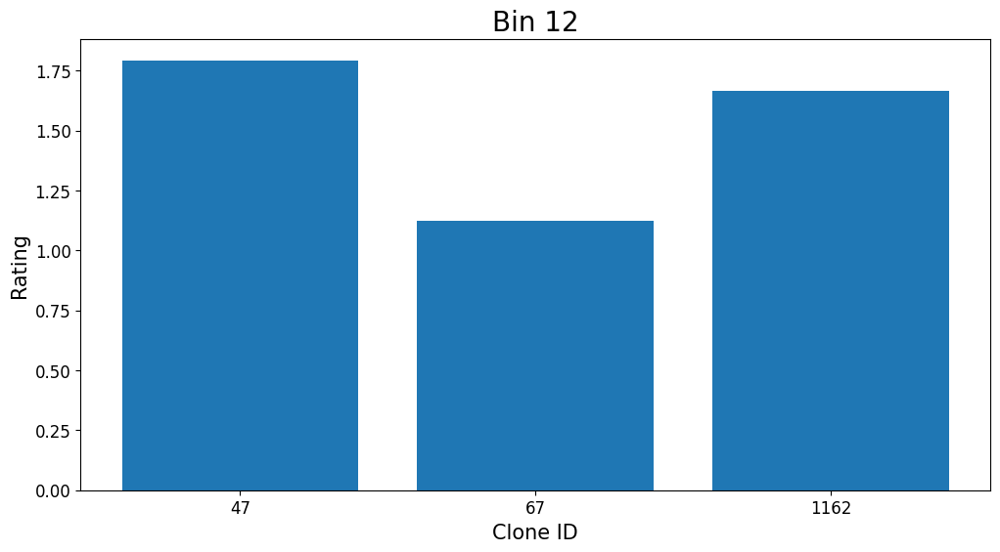

In [148]:
import matplotlib.pyplot as plt

# Loop through each of the 12 bins
for bin_num in range(1, 13):
    # Filter the data to include only the rows belonging to the current bin
    bin_data = clone_bins_ratings[clone_bins_ratings['bin'] == bin_num]
    
    # Check if the bin is empty
    if bin_data.empty:
        print(f'Bin {bin_num} is empty. No graph will be generated for this bin.')
        continue
    
    # Generate a bar graph for the current bin
    plt.figure(figsize=(12, 6))
    plt.bar(bin_data.index, bin_data['rating'])
    plt.title(f'Bin {bin_num}', fontsize=20)  # Increased fontsize for title
    plt.xlabel('Clone ID', fontsize=15)       # Increased fontsize for x-label
    plt.ylabel('Rating', fontsize=15)         # Increased fontsize for y-label
    plt.xticks(fontsize=12)                   # Increased fontsize for x-ticks
    plt.yticks(fontsize=12)                   # Increased fontsize for y-ticks
    plt.show()
